**Что мы уже умеем (и это круто!):**

*   Основы Python 
*   Pandas (наш швейцарский нож для работы с табличными данными).
*   Визуализация (Matplotlib/Seaborn/BI – чтобы не только видеть данные, но и показывать их другим... красиво!).
*   Базовые концепции ML и даже успели пощупать Scikit-learn.

**А что дальше?**

Сегодня мы сделаем шаг от уютных `.csv` файликов, учебных датасетов и простых БД к более суровым (и интересным!) реалиям. Мы узнаем:

*   Откуда вообще берутся данные, если их не принес на флешке заказчик или их нет в готовом виде? (Спойлер: иногда их нужно добывать)
*   Как не сойти с ума (и не потерять результаты недельной работы), когда над проектом трудится больше одного человека (или даже когда вы один, но через месяц хотите понять, что же вы там накодили)?
*   Какие "страшные" слова вроде Docker, Kubernetes и Spark на самом деле могут сделать вашу жизнь проще (честно-честно!).
*   И, конечно, немного заглянем в мир нейронных сетей – куда же без них в современном мире!

# 1. Сетевое программирование для сбора данных

Итак, данные. Кровь любого аналитического проекта. Иногда они лежат на блюдечке с голубой каемочкой (привет, `pd.read_csv()`), а иногда... их нужно добыть. И часто они живут в интернете.

Два основных способа достать данные из сети: через **API** (цивилизованный) и **веб-скрапинг** (партизанский, но иногда необходимый).

## А. APIs: Договариваемся по-хорошему

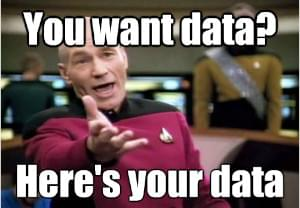



**Что такое API?**

Представьте, вы пришли в ресторан. Вы же не врываетесь на кухню и не начинаете сами рыться в кастрюлях, верно? Вы зовете официанта, смотрите меню и просите принести вам конкретное блюдо.

*   **Меню** – это документация API (описание того, какие данные можно получить и как их запросить).
*   **Официант** – это само API (интерфейс, который принимает ваш заказ и приносит результат).
*   **Ваш заказ** – это HTTP-запрос.
*   **Блюдо** – это данные, которые вы получаете (часто в формате JSON).

**API (Application Programming Interface)** – это, по сути, контракт, набор правил и протоколов, по которым одна программа может взаимодействовать с другой. Сайты и сервисы предоставляют API, чтобы разработчики могли программно получать их данные или использовать их функции. Это удобно, структурировано и, как правило, официально поддерживается.

**Наш главный инструмент для общения с API: библиотека `requests`**

Если Python – ваш язык, то `requests` – ваш лучший друг для походов в интернет за данными.

In [2]:
# Не забудьте установить, если еще не:
# !pip install requests
import requests
import json # для красивого вывода JSON

##### Основные "команды" официанту (HTTP-методы):

- `GET`: "Дайте мне вот это!" – самый частый метод для получения данных.
- `POST`: "Возьмите вот это (например, мои данные для логина или параметры для сложного отчета) и сделайте что-нибудь!" – для отправки данных на сервер.
- Есть и другие (PUT, DELETE и т.д.), но для сбора данных нам чаще всего нужен GET.

### Давайте попробуем! Пример: API курсов валют (публичное)



Возьмем простое API, которое не требует регистрации (пока что). Например, ExchangeRate-API.


>  всегда проверяйте условия использования публичных API. Некоторые могут требовать ключ или иметь ограничения на частоту запросов



In [109]:
# Пример URL для получения курсов относительно USD
url = "https://api.exchangerate-api.com/v4/latest/USD"

In [110]:
# Делаем GET-запрос
response = requests.get(url)

In [111]:
# Первым делом проверяем статус ответа. "Коды ответа – это как светофор для ваших запросов"
print(f"Статус-код: {response.status_code}")

Статус-код: 200


### Что нам говорит статус-код?
- 200: Всё ОК, заказ выполнен!
- 404: Not Found (Такого блюда/страницы нет)
- 403: Forbidden (Вам сюда нельзя, нет прав)
- 401: Unauthorized (Нужна авторизация, покажите пропуск/ключ)
- 500+: Server Error (Проблемы на кухне, официант не виноват)

In [112]:
if response.status_code == 200:
    # Посмотрим, что пришло (обычно это строка)
    # print(response.text) 
    
    # Но API часто отдают данные в формате JSON. Requests умеет его сразу парсить в словарь Python!
    data = response.json()
    print("\nДанные получены:")
    # Выведем красиво с помощью модуля json
    print(json.dumps(data, indent=4))
else:
    print(f"Что-то пошло не так. Текст ошибки: {response.text}")


Данные получены:
{
    "provider": "https://www.exchangerate-api.com",
    "WARNING_UPGRADE_TO_V6": "https://www.exchangerate-api.com/docs/free",
    "terms": "https://www.exchangerate-api.com/terms",
    "base": "USD",
    "date": "2025-05-06",
    "time_last_updated": 1746489601,
    "rates": {
        "USD": 1,
        "AED": 3.67,
        "AFN": 70.9,
        "ALL": 86.87,
        "AMD": 389.49,
        "ANG": 1.79,
        "AOA": 919.5,
        "ARS": 1178.5,
        "AUD": 1.55,
        "AWG": 1.79,
        "AZN": 1.7,
        "BAM": 1.73,
        "BBD": 2,
        "BDT": 121.51,
        "BGN": 1.73,
        "BHD": 0.376,
        "BIF": 2955.59,
        "BMD": 1,
        "BND": 1.29,
        "BOB": 6.92,
        "BRL": 5.66,
        "BSD": 1,
        "BTN": 84.35,
        "BWP": 13.61,
        "BYN": 3.04,
        "BZD": 2,
        "CAD": 1.38,
        "CDF": 2886.15,
        "CHF": 0.823,
        "CLP": 946.76,
        "CNY": 7.24,
        "COP": 4254.96,
        "CRC": 505.93,

In [113]:
 # Теперь с этим можно работать как с обычным словарем
print(f"\nКурс евро к доллару: {data['rates']['EUR']}")
print(f"Курс рубля к доллару: {data['rates']['RUB']}") # Ой, а если нет ключа RUB? ;)


Курс евро к доллару: 0.883
Курс рубля к доллару: 81.53


#### JSON: Универсальный язык общения в сети

**JSON (JavaScript Object Notation)** – это текстовый формат обмена данными, основанный на синтаксисе JavaScript. Но не пугайтесь, он очень простой и человекочитаемый.

- Состоит из пар "ключ": "значение" (как словари в Python).
- Значения могут быть строками, числами, булевыми значениями, массивами (списками в Python) или другими JSON-объектами.
- response.json() как раз превращает JSON-строку ответа в привычные нам структуры Python.

**Передача параметров в GET-запросах**

Часто API позволяет уточнить запрос, передав параметры. Например, запросить данные за определенную дату, или для конкретного пользователя, или отсортировать. Это делается через query parameters в URL (то, что идет после знака ?).

Библиотека requests позволяет удобно передавать параметры словарем:

In [117]:
# Пример с API для получения информации по почтовому индексу (США)
base_url_zip = "https://api.zippopotam.us/us/"
zip_code = "80211" # Легендарный Беверли-Хиллз
# Можно так:
# response_zip = requests.get(f"{base_url_zip}{zip_code}")

# А можно и так, если параметров много:
# (в данном API это не нужно, но для примера)
# params_for_zip = {'country': 'us', 'postal-code': '90210'}
# response_zip = requests.get("https://api.zippopotam.us", params=params_for_zip)
# requests сам соберет правильный URL: https://api.zippopotam.us/?country=us&postal-code=90210

In [118]:
response_zip = requests.get(f"{base_url_zip}{zip_code}")

In [119]:
if response_zip.status_code == 200:
    data_zip = response_zip.json()
    print("\nИнформация по ZIP коду:")
    print(json.dumps(data_zip, indent=4))
    place_name = data_zip['places'][0]['place name']
    state = data_zip['places'][0]['state']
    print(f"\nЭто {place_name}, штат {state}")
else:
    print(f"Ошибка при запросе ZIP: {response_zip.status_code}")


Информация по ZIP коду:
{
    "post code": "80211",
    "country": "United States",
    "country abbreviation": "US",
    "places": [
        {
            "place name": "Denver",
            "longitude": "-105.0204",
            "state": "Colorado",
            "state abbreviation": "CO",
            "latitude": "39.7665"
        }
    ]
}

Это Denver, штат Colorado


### Аутентификация: "Покажите вашу клубную карту!"



Многие API требуют аутентификацию, чтобы понимать, кто делает запрос, и контролировать доступ (например, ограничивать число запросов в минуту – rate limiting).



`API Ключи (API Keys)`: Самый простой способ. Это секретная строка, которую вы получаете при регистрации в сервисе. Обычно передается либо как параметр запроса, либо в заголовках (headers).


In [16]:
# Условный пример, как это могло бы выглядеть
# headers = {'Authorization': 'Bearer ВАШ_СУПЕР_СЕКРЕТНЫЙ_КЛЮЧ'}
# response = requests.get(url, headers=headers)

# ИЛИ
# params = {'apikey': 'ВАШ_СУПЕР_СЕКРЕТНЫЙ_КЛЮЧ'}
# response = requests.get(url, params=params)

`OAuth (1.0, 2.0)`: Более сложный, но и более безопасный и гибкий стандарт. Вы часто с ним сталкиваетесь, когда сайт предлагает `"Войти через Google/Facebook/GitHub"`. Для нас, как для пользователей API, это обычно означает несколько шагов для получения временного токена доступа. Сегодня глубоко не полезем, но знайте, что такое есть.

### Вопрос на подумать:

Представьте, вы нашли API, которое отдает погоду, но только для одного города за раз по его названию. А вам нужно собрать актуальную погоду для списка из 100 городов. Как бы вы организовали свой код на Python с использованием requests? Какие потенциальные проблемы вы видите и как бы постарались их избежать?


## Б. Веб-скрапинг: Когда API нет или оно "жадничает"

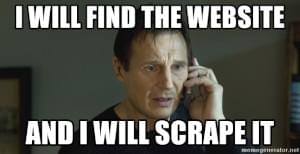!

Иногда API нет. Или оно есть, но не отдает нужные вам данные (например, комментарии пользователей под статьей, а API отдает только саму статью). Вот тут на сцену выходит веб-скрапинг (или веб-парсинг).

**Суть метода:**
Ваш скрипт притворяется браузером, заходит на веб-страницу, скачивает её HTML-код, а затем "разбирает" этот код, чтобы вытащить нужную информацию.

**Аналогия:** Если меню в ресторане (API) неполное или его вообще нет, вам приходится аккуратно заглядывать на кухню (сайт), чтобы посмотреть, из чего готовят блюда. **Ключевое слово – "аккуратно"!**

**Минимальный набор знаний об HTML:**

Нам не нужно становиться веб-разработчиками, но понимать структуру HTML-документа хотя бы на базовом уровне – маст-хэв.

*   **Теги:** `<h1>`, `<p>`, `<a>`, `<div>`, `<span>`, `<table>`, `<tr>`, `<td>` и т.д. Они определяют структуру и тип контента. (Например, `<a>` – это ссылка, `<h1>` – главный заголовок).
*   **Атрибуты:** У тегов могут быть атрибуты, которые дают дополнительную информацию. Самые важные для нас:
    *   `class`: для стилизации и группировки элементов (может быть у многих элементов).
    *   `id`: уникальный идентификатор элемента на странице (должен быть один такой).
    *   `href`: у ссылок (`<a>`) указывает URL, куда ведет ссылка.
    *   `src`: у картинок (`<img>`) указывает путь к файлу изображения.

**Наш инструмент для "разделки" HTML: `BeautifulSoup`**

Библиотека `BeautifulSoup` – это наш главный помощник в превращении HTML-супа (или XML-супа) в понятные структуры данных, из которых легко доставать информацию.

In [66]:
# Не забудьте установить:
# !pip install beautifulsoup4 lxml 
# lxml - это быстрый и надежный парсер, который BeautifulSoup может использовать
from bs4 import BeautifulSoup
import time # пригодится, чтобы быть вежливыми
# requests уже должен быть импортирован выше
import requests 
# json тоже
import json
import lxml

**Пример: Скрапим цитаты (с сайта, созданного для тренировки)**

*(Дисклеймер: Всегда проверяйте файл `robots.txt` сайта, который собираетесь скрапить, и его Условия использования (Terms of Service). Уважайте чужие ресурсы!)*

Возьмем сайт с цитатами `http://quotes.toscrape.com/`, который специально сделан для таких упражнений.
Наша задача – вытащить текст цитаты, автора и теги.

Стандарт исключений для роботов — стандарт ограничения доступа роботам к содержимому на http-сервере при помощи текстового файла robots.txt, находящегося в корне сайта (то есть имеющего путь относительно имени сайта /robots.txt). Действие файла не распространяется на сайты, расположенные на поддоменах.

Следование стандарту добровольно. Стандарт был принят консорциумом W3C 30 января 1994 года в списке рассылки robots-request@nexor.co.uk и с тех пор используется большинством известных поисковых машин.

Файл robots.txt используется для частичного управления обходом сайта поисковыми роботами. Этот файл состоит из набора инструкций для поисковых машин, при помощи которых можно задать файлы, страницы или каталоги сайта, которые не должны запрашиваться.

## Что такое `robots.txt`?

`robots.txt` — это текстовый файл, который веб-мастера размещают в корневом каталоге своего сайта. Он предназначен для того, чтобы давать инструкции веб-роботам (поисковым паукам, скраперам и другим автоматизированным агентам) о том, какие страницы или разделы сайта **не следует** сканировать или индексировать.

**Ключевые моменты:**

*   **Стандарт исключений для роботов (Robots Exclusion Protocol, REP):** `robots.txt` является частью этого стандарта.
*   **Рекомендация, а не запрет:** Файл `robots.txt` носит рекомендательный характер. "Хорошие" роботы (например, Googlebot, YandexBot) следуют этим инструкциям. "Плохие" роботы могут их игнорировать.
*   **Публичность:** Файл доступен всем по адресу `http://имя_сайта/robots.txt`.
*   **Не для безопасности:** Не используйте `robots.txt` для скрытия конфиденциальной информации. Для этого существуют другие механизмы (например, аутентификация).

## Где найти `robots.txt`?

Файл всегда находится в корневом каталоге сайта.
Например:
*   `https://google.com/robots.txt`
*   `https://wikipedia.org/robots.txt`
*   `https://yandex.ru/robots.txt`

## Основные директивы `robots.txt`



Файл состоит из набора правил. Каждое правило обычно включает:

1.  **`User-agent`**: Указывает, к какому роботу относится правило.
    *   `User-agent: *` — правило для всех роботов.
    *   `User-agent: Googlebot` — правило только для робота Google.
    *   `User-agent: MyCoolScraper` — правило для вашего конкретного скрапера (если вы его так назовете).

2.  **`Disallow`**: Указывает путь, который роботу **запрещено** посещать.
    *   `Disallow: /private/` — запрещает доступ ко всему, что находится в папке `/private/`.
    *   `Disallow: /admin`
    *   `Disallow: /search`
    *   `Disallow: /tmp/*.php` — запрещает доступ к PHP файлам в папке `/tmp/`.
    *   `Disallow: /` — запрещает доступ ко всему сайту (будьте осторожны!).

3.  **`Allow`**: Явно разрешает роботу посещать указанный путь. Это полезно, если нужно разрешить доступ к поддиректории внутри запрещенной директории. `Allow` имеет приоритет над `Disallow` для одного и того же робота, если путь в `Allow` более специфичен или равен пути в `Disallow`.
    *   Пример:
        ```
        User-agent: *
        Disallow: /private/
        Allow: /private/public_page.html
        ```
        Здесь запрещен доступ ко всей папке `/private/`, но разрешен к файлу `public_page.html` внутри нее.

4.  **`Crawl-delay`**: (Нестандартная, но поддерживается многими) Указывает минимальное время в секундах между запросами робота к серверу. Это помогает снизить нагрузку на сервер.
    *   `Crawl-delay: 5` — робот должен ждать 5 секунд между запросами.

5.  **`Sitemap`**: Указывает путь к файлу (или файлам) Sitemap XML. Это помогает роботам эффективнее находить и индексировать контент сайта.
    *   `Sitemap: https://www.example.com/sitemap.xml`

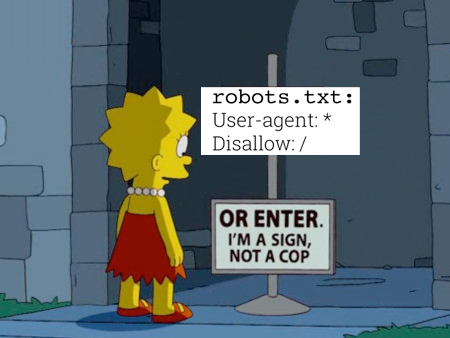

## Почему `robots.txt` важен для скрапинга?

1.  **Этичность:** Уважение к `robots.txt` — это признак "хорошего тона" и ответственного скрапинга. Вы показываете, что уважаете правила, установленные владельцем сайта.
2.  **Снижение нагрузки на сервер:** Сайты могут запрещать скрапинг определенных разделов (например, результатов поиска, которые генерируются динамически и создают большую нагрузку) или всего сайта. Игнорирование этого может привести к перегрузке сервера.
3.  **Избежание блокировки:** Если ваш скрапер будет слишком агрессивен или будет игнорировать `robots.txt`, ваш IP-адрес или `User-agent` могут заблокировать.
4.  **Юридические аспекты:** Хотя сам по себе `robots.txt` не является юридически обязывающим документом, его игнорирование может быть расценено как нарушение условий использования сайта (Terms of Service), что может иметь юридические последствия.

## Как парсить `robots.txt` в Python?

В стандартной библиотеке Python есть модуль `urllib.robotparser` для работы с `robots.txt`.

In [21]:
from urllib.robotparser import RobotFileParser
from urllib.parse import urljoin


In [120]:
# URL сайта, который мы хотим скрапить
site_url = "https://misis.ru/"
# URL файла robots.txt
robots_url = urljoin(site_url, "robots.txt")

In [52]:
rp = RobotFileParser()
rp.set_url(robots_url) # Указываем URL файла robots.txt
rp.read() # Читаем и парсим файл

In [55]:
# Определяем User-agent нашего скрапера
user_agent_scraper = "MyCoolPythonScraper/1.0"
user_agent_google = "Yandex"

In [56]:
# URLы, которые мы хотим проверить
url_to_check1 = "https://misis.ru/search/" # Обычно поисковые формы запрещены
url_to_check2 = "https://misis.ru/news/"

In [57]:
# Проверяем, можем ли мы получить доступ
can_fetch1_scraper = rp.can_fetch(user_agent_scraper, url_to_check1)
can_fetch2_scraper = rp.can_fetch(user_agent_scraper, url_to_check2)

In [58]:
can_fetch1_google = rp.can_fetch(user_agent_google, url_to_check1)
can_fetch2_google = rp.can_fetch(user_agent_google, url_to_check2)

In [59]:
print(f"Для '{user_agent_scraper}':")
print(f"  Можем ли скрапить '{url_to_check1}'? {'Да' if can_fetch1_scraper else 'Нет'}")
print(f"  Можем ли скрапить '{url_to_check2}'? {'Да' if can_fetch2_scraper else 'Нет'}")


Для 'MyCoolPythonScraper/1.0':
  Можем ли скрапить 'https://misis.ru/search/'? Нет
  Можем ли скрапить 'https://misis.ru/news/'? Да


In [62]:
print(f"\nДля '{user_agent_google}':")
print(f"  Может ли Хуandex сканировать '{url_to_check1}'? {'Да' if can_fetch1_google else 'Нет'}")
print(f"  Может ли Хуandex сканировать '{url_to_check2}'? {'Да' if can_fetch2_google else 'Нет'}")


Для 'Yandex':
  Может ли Хуandex сканировать 'https://misis.ru/search/'? Нет
  Может ли Хуandex сканировать 'https://misis.ru/news/'? Да


In [63]:
# Получить задержку сканирования (если указана)
crawl_delay_scraper = rp.crawl_delay(user_agent_scraper)
if crawl_delay_scraper:
    print(f"\nРекомендуемая задержка для '{user_agent_scraper}': {crawl_delay_scraper} секунд")

In [64]:
request_rate_scraper = rp.request_rate(user_agent_scraper)
if request_rate_scraper:
    print(f"Рекомендуемая частота запросов для '{user_agent_scraper}': {request_rate_scraper.requests} запросов за {request_rate_scraper.seconds} секунд")

Важные моменты:
- Всегда проверяйте robots.txt перед скрапингом.
- Уважайте директивы Disallow и Crawl-delay.
- Используйте осмысленный User-agent, чтобы владельцы сайта могли идентифицировать вашего робота и, при необходимости, связаться с вами. Например: MyStudentProjectScraper/1.0 (+http://myuniversity.edu/myprojectinfo).
- Не перегружайте сервер: даже если robots.txt не указывает Crawl-delay, делайте разумные задержки между запросами (например, time.sleep(1) или больше).
- robots.txt — это только часть картины. Также важно ознакомиться с Условиями использования сайта (Terms of Service / ToS), которые могут содержать более строгие правила относительно автоматизированного сбора данных.
- Если robots.txt отсутствует, это не означает, что можно скрапить всё подряд без ограничений. Руководствуйтесь здравым смыслом и этическими соображениями.

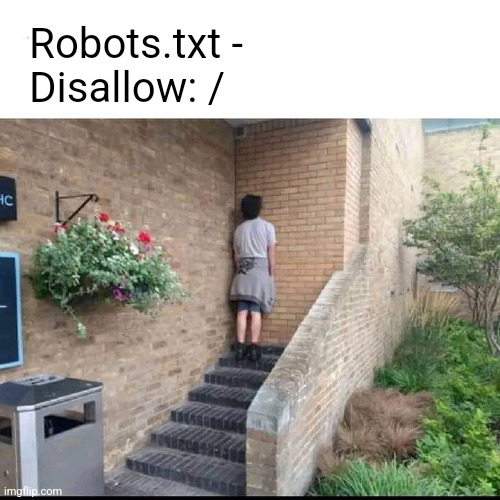

## press R to Return

In [70]:
# URL сайта
scrape_url = "http://quotes.toscrape.com/"

# 1. Получаем HTML-страницу
try:
    response_scrape = requests.get(scrape_url)
    response_scrape.raise_for_status() # Проверит на HTTP ошибки (4xx, 5xx)
    
# 2. Создаем "суп"
    soup = BeautifulSoup(response_scrape.text, 'html.parser') # или 'html.parser', если lxml не установлен

# 3. Ищем нужные элементы
    # На сайте quotes.toscrape.com цитаты находятся в div'ах с классом 'quote'
    # А сам текст цитаты в span с классом 'text'
    # Автор в small с классом 'author'
    
    quotes_data = []
    
    all_quotes_divs = soup.find_all('div', class_='quote') # Найти все div'ы с классом 'quote'
    
    print(f"Найдено {len(all_quotes_divs)} блоков с цитатами на странице.")

    for quote_div in all_quotes_divs:
        text_element = quote_div.find('span', class_='text')
        text = text_element.text if text_element else "N/A"
        
        author_element = quote_div.find('small', class_='author')
        author = author_element.text if author_element else "N/A"
        
        # Ссылки на теги - это теги 'a' с классом 'tag'
        tags_elements = quote_div.find_all('a', class_='tag')
        tags = [tag.text for tag in tags_elements]
        
        quotes_data.append({
            'text': text,
            'author': author,
            'tags': tags
        })
        
        # Будем вежливы - небольшая задержка (здесь не строго обязательно, т.к. одна страница и учебный сайт)
        # time.sleep(0.1) 

    # 4. Пользуемся результатом
    if quotes_data:
        print(f"\nСкрапинг сайта {scrape_url} успешен! Собрано цитат: {len(quotes_data)}")
        for i, item in enumerate(quotes_data[:2]): # Выведем первые 2 для примера
            print(f"\nЦитата #{i+1}:")
            print(f"  Текст: {item['text']}")
            print(f"  Автор: {item['author']}")
            print(f"  Теги: {', '.join(item['tags'])}")
        
        # А теперь можно и в Pandas DataFrame это загрузить!
        # import pandas as pd
        # df_quotes = pd.DataFrame(quotes_data)
        # print("\nПервые 5 строк DataFrame:")
        # print(df_quotes.head())
            
    else:
        print(f"Не удалось найти цитаты на {scrape_url}. Возможно, структура сайта изменилась или я что-то не так делаю?")

except requests.exceptions.RequestException as e:
    print(f"Ошибка при запросе к {scrape_url}: {e}")
except Exception as e:
    print(f"Произошла непредвиденная ошибка при скрапинге: {e}")

Найдено 10 блоков с цитатами на странице.

Скрапинг сайта http://quotes.toscrape.com/ успешен! Собрано цитат: 10

Цитата #1:
  Текст: “The world as we have created it is a process of our thinking. It cannot be changed without changing our thinking.”
  Автор: Albert Einstein
  Теги: change, deep-thoughts, thinking, world

Цитата #2:
  Текст: “It is our choices, Harry, that show what we truly are, far more than our abilities.”
  Автор: J.K. Rowling
  Теги: abilities, choices


In [69]:
quotes_data

[{'text': '“The world as we have created it is a process of our thinking. It cannot be changed without changing our thinking.”',
  'author': 'Albert Einstein',
  'tags': ['change', 'deep-thoughts', 'thinking', 'world']},
 {'text': '“It is our choices, Harry, that show what we truly are, far more than our abilities.”',
  'author': 'J.K. Rowling',
  'tags': ['abilities', 'choices']},
 {'text': '“There are only two ways to live your life. One is as though nothing is a miracle. The other is as though everything is a miracle.”',
  'author': 'Albert Einstein',
  'tags': ['inspirational', 'life', 'live', 'miracle', 'miracles']},
 {'text': '“The person, be it gentleman or lady, who has not pleasure in a good novel, must be intolerably stupid.”',
  'author': 'Jane Austen',
  'tags': ['aliteracy', 'books', 'classic', 'humor']},
 {'text': "“Imperfection is beauty, madness is genius and it's better to be absolutely ridiculous than absolutely boring.”",
  'author': 'Marilyn Monroe',
  'tags': ['be-

In [73]:
import pandas as pd
df_quotes = pd.DataFrame(quotes_data)
df_quotes.head(5)

,text,author,tags
0,“The world as we have created it is a process ...,Albert Einstein,"[change, deep-thoughts, thinking, world]"
1,"“It is our choices, Harry, that show what we t...",J.K. Rowling,"[abilities, choices]"
2,“There are only two ways to live your life. On...,Albert Einstein,"[inspirational, life, live, miracle, miracles]"
3,"“The person, be it gentleman or lady, who has ...",Jane Austen,"[aliteracy, books, classic, humor]"
4,"“Imperfection is beauty, madness is genius and...",Marilyn Monroe,"[be-yourself, inspirational]"


**Как искать элементы в `BeautifulSoup` (шпаргалка):**

*   `soup.find('тег')`: находит **первый** попавшийся тег.
*   `soup.find_all('тег')`: находит **все** теги и возвращает список (точнее, `ResultSet`, похожий на список).
*   Поиск по классу: `soup.find_all('div', class_='my-class')` (обратите внимание на `class_` с подчеркиванием, т.к. `class` – зарезервированное слово в Python).
*   Поиск по ID: `soup.find(id='unique-id')`.
*   Поиск по атрибутам: `soup.find_all('a', attrs={'data-custom': 'value'})`.
*   Вложенный поиск: `div_element.find('h2')` (искать `h2` только внутри `div_element`).
*   Достать текст: `element.text` (часто лучше) или `element.get_text(separator=' ', strip=True)` (для контроля над пробелами и разделителями).
*   Достать атрибут: `link_element['href']` или `link_element.get('href')` (второй вариант безопаснее, вернет `None` если атрибута нет, а первый вызовет ошибку).

**Этика и лучшие практики скрапинга (ОЧЕНЬ ВАЖНО!!!):**

Скрапинг – мощный инструмент, но с ним нужно обращаться ответственно. Иначе можно навредить сайту или даже получить по шапке (юридической или технической). "Не будьте слоном в посудной лавке интернета!"

1.  **`robots.txt` – ЗАКОН!**
    *   Это файл в корне сайта (например, `имя_сайта.com/robots.txt`), где владелец сайта указывает, какие части сайта можно или нельзя индексировать (и скрапить) роботам.
    *   **Всегда проверяйте `robots.txt` перед скрапингом!** Если там `Disallow: /нужный_вам_раздел/`, то скрапить этот раздел нельзя. И точка.
    *   Пример: `User-agent: *` (для всех роботов), `Disallow: /admin/` (не трогать админку), `Allow: /public/` (можно трогать папку public).

2.  **Будьте "добрым" ботом – не перегружайте сервер!**
    *   Не делайте слишком много запросов в секунду. Сайты могут вас забанить по IP.
    *   Используйте `time.sleep(секунды)` между запросами. Хотя бы 1-2 секунды, а для некоторых сайтов и больше. "Не будьте DDoS-ером поневоле."

3.  **Идентифицируйте себя (User-Agent):**
    *   По умолчанию `requests` представляется как `python-requests/версия`. Некоторые сайты это блокируют.
    *   Хорошая практика – указывать `User-Agent`, похожий на браузер, или кастомный, объясняющий цель вашего скрапера (если это уместно и вы не пытаетесь скрыть свою активность для обхода ограничений).
    ```python
    # Пример заголовка
    # headers = {
    #    'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/91.0.4472.124 Safari/537.36'
    # }
    # response = requests.get(url, headers=headers)
    ```

4.  **Условия использования (Terms of Service / ToS):**
    *   Многие сайты в своих ToS явно запрещают автоматический сбор данных. Нарушение ToS может иметь юридические последствия. Читайте мелкий шрифт!

5.  **Кэшируйте результаты:**
    *   Если вы отлаживаете скрапер, не дергайте сайт на каждой итерации. Сохраните HTML-страницу локально (например, в файл) и работайте с ней. Это сэкономит и ваше время, и ресурсы сервера.

6.  **Динамический контент (JavaScript):**
    *   `requests` + `BeautifulSoup` отлично работают со статичными HTML-страницами (где весь контент есть в исходном коде, который отдает сервер).
    *   Но многие современные сайты подгружают данные с помощью JavaScript уже *после* загрузки основной страницы (AJAX, SPA - Single Page Applications). Такой контент `requests` не увидит, потому что он не исполняет JavaScript.
    *   Для "тяжелых" случаев (сайты на React, Angular, Vue, с бесконечной прокруткой) нужна "тяжелая артиллерия" – инструменты, которые умеют исполнять JavaScript, например, **Selenium** или **Playwright**. Они управляют реальным браузером. Это круто, но сложнее, медленнее и ресурсозатратнее. Сегодня мы их не трогаем, но знайте, что они существуют для особых случаев.


🤔 **Вопрос на логику и этику:**
Вы хотите собрать цены на определенные товары с популярного интернет-магазина. API у него нет. Вы смотрите `robots.txt` и видите строчку:


`User-agent: *`
`Disallow: /product-details/`
`Disallow: /search?query=*`

Именно в `/product-details/` находится подробная информация о товаре, включая цену, а через `/search` вы хотели искать товары.

Ваши действия?

# 2. GIT

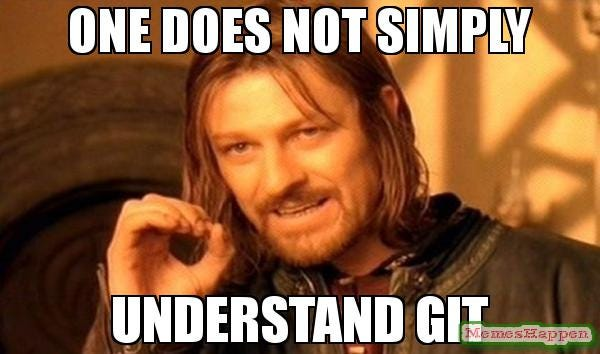

"О, нет, только не опять кусок лекции про GIT!" – возможно, подумали некоторые из вас. Да, поначалу он может показаться немного... запутанным. Но поверьте, для любого, кто пишет код (а Data Scientist'ы пишут код!), GIT – это как кнопка "Сохранить" на стероидах, плюс машина времени, плюс инструмент для мирного сосуществования в команде.

**Зачем DS'у GIT? Разве это не для программистов?**

1.  **Контроль версий вашего кода:**
    *   Больше никаких `final_script.py`, `final_script_v2.py`, `final_script_v2_working_FOR_REAL_THIS_TIME.py`. GIT помнит все изменения.
    *   Вы всегда можете вернуться к предыдущей работающей версии, если что-то сломали. "Откатить изменения – бесценно!"
2.  **Контроль версий ваших экспериментов:**
    *   Попробовали новую фичу? Другие параметры модели? Новую предобработку? Сохраните это как отдельную "версию" (коммит или ветку). Легко сравнить результаты.
3.  **Совместная работа:**
    *   Если вы работаете не в гордом одиночестве, GIT помогает нескольким людям одновременно работать над одним проектом, не мешая друг другу и не затирая чужой код.
4.  **Воспроизводимость:**
    *   Хороший GIT-репозиторий (особенно с привязанными версиями данных, о чем позже) – ключ к тому, чтобы ваш коллега (или вы сами через полгода) смогли воспроизвести ваши результаты.
5.  **Это стандарт индустрии:**
    *   Знание GIT – это как умение читать. Ожидается по умолчанию.

**Основные концепции GIT (на пальцах):**

*   **Репозиторий (Repository, или "репо"):** Папка с вашим проектом, за которой следит GIT. В ней есть скрытая папка `.git`, где хранится вся магия: история изменений, ветки и т.д. "Это как сейф для вашего кода".
*   **Коммит (Commit):** "Снимок" состояния вашего проекта в определенный момент времени. Каждый коммит имеет уникальный идентификатор (хэш) и сообщение, описывающее, что было изменено. "Зафиксировали изменения и подписали: 'Добавил крутую фичу!'"
*   **Ветка (Branch):** Параллельная линия разработки. Основная ветка обычно называется `main` (раньше `master`). Вы можете создавать новые ветки, чтобы работать над новой фичей или экспериментом, не затрагивая основную работающую версию. "Песочница для экспериментов".
*   **Слияние (Merge):** Процесс объединения изменений из одной ветки в другую. Например, когда вы закончили работу над фичей в своей ветке и хотите добавить её в `main`.
*   **Удаленный репозиторий (Remote Repository):** Копия вашего репозитория, хранящаяся где-то в сети (например, на GitHub, GitLab, Bitbucket). Это позволяет синхронизировать работу между разными компьютерами и разными людьми. "Облачное хранилище для вашего сейфа с кодом".

**Практика с гитом

#### 1. Инициализация репозитория:
Создайте на своем компьютере папку, например, `my_git_project`, перейдите в неё в терминале (или используйте `%cd` в Jupyter).


"Сказать GIT'у: начинай следить за этой папкой!"



`git init`

#### 2. Создадим пару файлов

`data_processing.py` с

In [ ]:
# Этот скрипт будет обрабатывать данные\n"
print('Data processing started')\n"

`README.md`  с 

In [ ]:
# Мой первый GIT-проект\n
Это учебный проект для демонстрации GIT.\n

#### 3. Проверка статуса:

"Что у нас тут происходит?"



`git status`

(GIT покажет "untracked files" – файлы, которые он видит, но еще не отслеживает).



#### 4. Добавление файлов в "зону подготовки" (Staging Area):


"Выбираем, какие изменения войдут в следующий коммит".



`git add README.md`
`git add data_processing.py`
> Или сразу все новые/измененные файлы в текущей папке:
> !git add . 

`git status` 

#### 5. Создание первого коммита и Просмотр истории коммитов

"Делаем снимок состояния с осмысленным сообщением".



`git commit -m "Initial commit: Added README and data processing script structure"`

`git status`

`git log --oneline`

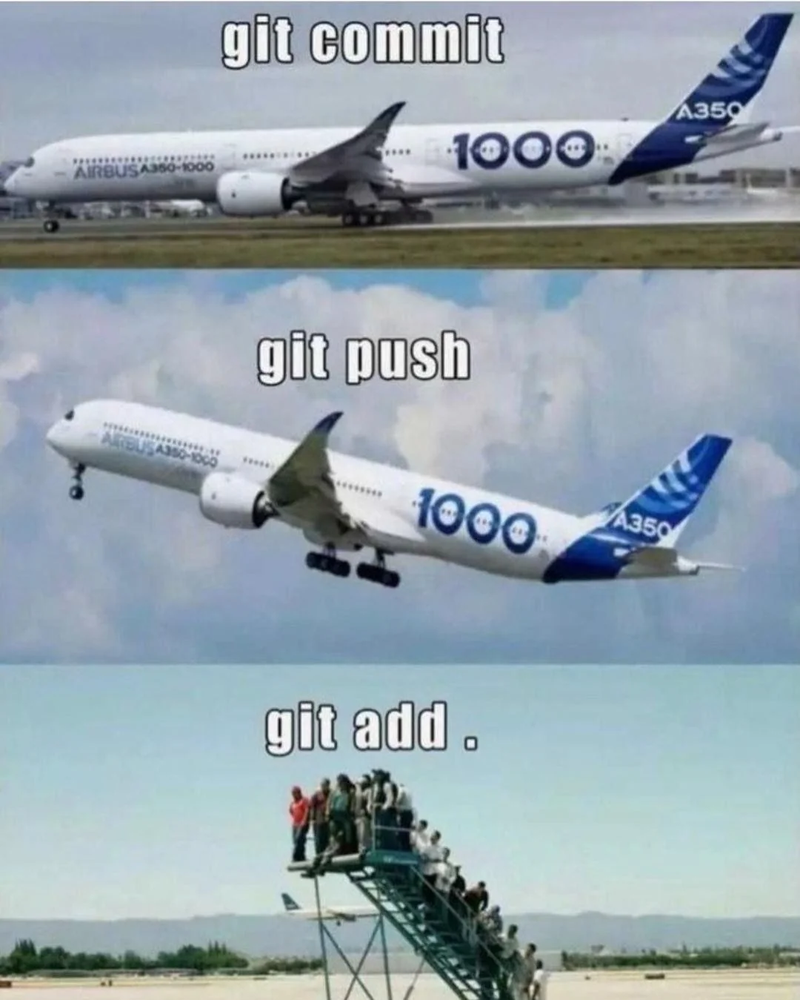

#### 6. Внесение изменений и новый коммит:



Откройте data_processing.py и добавьте туда что-нибудь, например:
`print('Processing complete!')`

`git status `

`git add data_processing.py `


Снова добавляем в staging (даже если файл уже отслеживается, его изменения нужно "застейджить")

Можно использовать `git add .` чтобы добавить все измененные и новые файлы

`git commit -m "Updated data_processing.py with completion message"`
`git log --oneline`

#### 7. Создание ветки и работа в ней:


"Хочу попробовать новую фичу, но не хочу ломать то, что уже работает в main".



Создаем новую ветку с именем feature/awesome-analysis
`git branch feature/awesome-analysis`

Посмотреть все ветки (звездочкой * отмечена текущая)
`git branch `

Переключаемся на новую ветку
`git checkout feature/awesome-analysis`
`git branch` # Убедимся, что мы на ней

Теперь вы в ветке feature/awesome-analysis. Любые коммиты здесь не затронут ветку main до тех пор, пока вы их не сольете.


Добавьте новый файл, например `analysis.py`, или измените существующие.



In [ ]:
# Здесь будет крутой анализ\nimport pandas as pd\n


`git add analysis.py`

`git commit -m "Added initial analysis script in feature branch"`

`git log --oneline `

>Обратите внимание, этот коммит есть только в текущей ветке

#### 8. Слияние ветки (Merge):


"Фича готова, пора добавить её в основную ветку!"



Сначала возвращаемся в ту ветку, КУДА хотим влить изменения (т.е. в main)

`git checkout main`

`git checkout master`

Теперь сливаем ветку feature/awesome-analysis В ТЕКУЩУЮ (main)
`git merge feature/awesome-analysis`

`git log --oneline`
Теперь коммит из feature-ветки появился и в main!

Файл `analysis.py` тоже должен появиться в вашей папке.

Ветку feature/awesome-analysis можно удалить, если она больше не нужна

`git branch -d feature/awesome-analysis`

Это был простой случай "fast-forward merge". Иногда бывают конфликты слияния, если в обеих ветках были изменены одни и те же строки кода. GIT попытается их слить автоматически, но если не сможет – попросит вас разрешить конфликт вручную.



#### 9. Как "откатиться"? (Варианты):



##### Посмотреть состояние файла на определенный коммит:


Сначала `git log --oneline` чтобы найти хэш нужного коммита (например, abc1234)

`git checkout 3bbf2c7  -- data_processing.py `

In [ ]:
3bbf2c7 

Эта команда вернет файл data_processing.py к состоянию на коммит abc1234, но оставит вас на текущей ветке. Изменения будут в "Changes to be committed", вы можете их закоммитить или отменить.

##### "Отменить" коммит (создать новый коммит, который делает обратное): git revert

Это безопасный способ отменить изменения, так как он не переписывает историю, а добавляет новый коммит, который является "антиподом" указанного.


`git log --oneline` (найти хэш коммита, который хотим "отменить")
`git revert` <хэш_коммита_который_хотим_отменить> 

##### Полный возврат к состоянию предыдущего коммита (ОПАСНО, если уже поделились историей): git reset


`git reset --hard <хэш_предыдущего_коммита>` удалит все коммиты после указанного и вернет файлы к его состоянию. Это переписывает историю. Используйте с большой осторожностью, особенно если репозиторий уже на GitHub!
Для локальных экспериментов, которые еще никуда не ушли, reset может быть полезен.

#### 10. Работа с удаленными репозиториями (GitHub/GitLab):



Это то, как вы делитесь кодом и работаете совместно.

- Создайте пустой репозиторий на GitHub (без README, .gitignore и лицензии, если вы хотите запушить существующий локальный).
- GitHub даст вам URL вашего репозитория (например, https://github.com/your_username/my_git_project.git).
- Свяжите ваш локальный репозиторий с удаленным:

`git remote add origin https://github.com/your_username/my_git_project.git`

Отправьте ваши локальные коммиты (из ветки main) на удаленный сервер:


`git push -u origin main`

Если кто-то другой (или вы с другого компьютера) внес изменения в удаленный репозиторий, вы можете скачать их себе:

`git pull origin main`

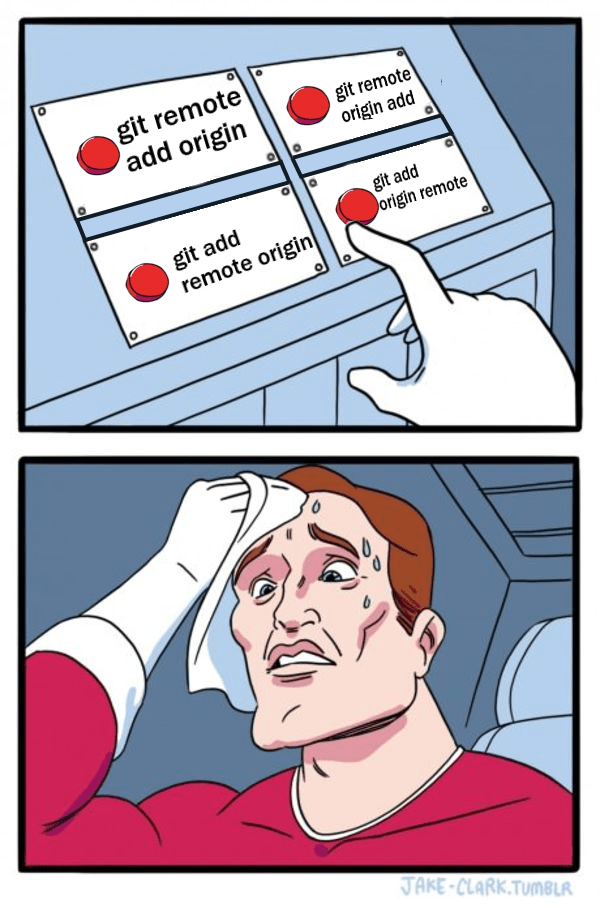

#### Файл .gitignore:

Часто в проекте есть файлы, которые не нужно добавлять в GIT: временные файлы, кэш, большие файлы данных (если они не версионируются специально), секреты, виртуальные окружения (`venv/`, `__pycache__/`, `.ipynb_checkpoints/`).

Создайте файл .gitignore в корне репозитория и перечислите в нем шаблоны имен файлов/папок, которые GIT должен игнорировать.

Пример .gitignore для Python-проекта:

In [ ]:
__pycache__/
*.pyc
.DS_Store
venv/
.env
*.ipynb_checkpoints
# Можно добавить большие файлы данных, если они не должны быть в репо
# data/large_dataset.csv 

Добавьте .gitignore в репозиторий как обычный файл: `git add .gitignore` и `git commit -m "Add .gitignore"`



# 3. Введение в Мир Больших Данных и Инфраструктуры

**Что такое Big Data? "Когда данные не влезают..."**

Термин "Большие Данные" (Big Data) уже набил оскомину, но суть его проста: это данные, которые настолько велики по **объему (Volume)**, поступают с такой **скоростью (Velocity)** или настолько **разнообразны (Variety)**, что традиционные инструменты обработки данных (вроде Excel или даже Pandas на одном компьютере) с ними не справляются.

Классические "Три V" больших данных:

1.  **Volume (Объем):**
    *   Терабайты, петабайты, эксабайты данных. Это могут быть логи веб-серверов, данные с IoT-устройств, транзакции, научные данные (геномика, астрономия) и т.д.
    *   *Аналогия:* Если раньше ваши данные помещались в папку на столе, то теперь это целый склад, забитый коробками до потолка.

2.  **Velocity (Скорость):**
    *   Данные поступают и должны обрабатываться очень быстро, часто в режиме реального времени.
    *   Примеры: потоки данных из социальных сетей, биржевые котировки, данные с датчиков самоуправляемого автомобиля.
    *   *Аналогия:* Информация не просто лежит на складе, а несется по конвейеру с огромной скоростью.

3.  **Variety (Разнообразие):**
    *   Данные могут быть не только структурированными (таблицы, как мы привыкли в SQL или Pandas), но и полуструктурированными (JSON, XML, логи) или вовсе неструктурированными (тексты, изображения, видео, аудио).
    *   *Аналогия:* На вашем складе не только аккуратные коробки одного размера, но и мешки, бочки, какие-то непонятные свертки и даже живые осьминоги (шутка... или нет?).

К этим трем "V" часто добавляют еще несколько:

*   **Veracity (Достоверность):** Насколько данные точны и можно ли им доверять? Большие данные часто бывают "шумными", неполными, противоречивыми. "Мусор на входе – мусор на выходе", только в гигантских масштабах.
*   **Value (Ценность):** Сами по себе большие данные – это просто много информации. Главное – извлечь из них пользу, знания, которые приведут к принятию лучших решений или созданию новых продуктов. "Найти иголку в стоге сена размером с Эверест".
*   **Variability (Изменчивость):** Структура данных или их смысл могут меняться со временем.

**Основные вызовы Big Data:**

*   **Хранение:** Где и как хранить такие объемы? Нужны распределенные файловые системы.
*   **Обработка:** Как обрабатывать данные, которые не помещаются в память одного компьютера? Нужны распределенные вычисления.
*   **Анализ:** Как извлекать знания из этого океана информации? Нужны специализированные инструменты и алгоритмы, способные работать параллельно.

**Прародитель идеи: Экосистема Hadoop**

Когда говорят о Big Data, часто первым на ум приходит **Hadoop**. Это не один инструмент, а целая экосистема проектов с открытым исходным кодом. Ключевые компоненты (очень упрощенно):

*   **HDFS (Hadoop Distributed File System):** Распределенная файловая система. Ваши огромные файлы разбиваются на блоки и хранятся на множестве обычных серверов (узлов кластера). Обеспечивает отказоустойчивость (если один сервер умрет, данные не потеряются, т.к. есть копии). "Представьте, что ваша книга не лежит целиком на одной полке, а ее страницы разложены по разным полкам в разных комнатах, но у вас есть каталог, где какая страница".
*   **MapReduce:** Модель программирования для распределенной обработки больших наборов данных. Состоит из двух основных фаз:
    *   **Map:** Первая фаза, где исходные данные обрабатываются параллельно на разных узлах. Каждый узел применяет функцию `map` к своей части данных (например, считает слова в тексте).
    *   **Reduce:** Вторая фаза, где результаты работы `map`-функций собираются вместе и агрегируются (например, суммируются все подсчеты слов).
    "Принцип 'разделяй и властвуй' в действии. Сначала много гномиков (map-задачи) параллельно делают свою маленькую работу, а потом главный гном (reduce-задача) собирает все результаты."
*   **YARN (Yet Another Resource Negotiator):** Менеджер ресурсов кластера Hadoop. Он отвечает за распределение вычислительных ресурсов (CPU, память) между различными приложениями, работающими в кластере.

Hadoop был революцией, но MapReduce довольно низкоуровневый и писать на нем не всегда удобно. На смену ему (или в дополнение) пришли более современные и удобные инструменты, и один из главных – это Apache Spark.

---

###  Apache Spark 

**Apache Spark: "Швейцарский нож для Big Data"**


Если Hadoop – это такой основательный, но немного неповоротливый грузовик для перевозки данных, то **Apache Spark** – это скорее гоночный болид, который еще и умеет трансформироваться в разные полезные штуки.

**Spark** – это фреймворк для распределенной обработки данных с открытым исходным кодом. Он стал невероятно популярен благодаря своей **скорости** (он может быть до 100 раз быстрее Hadoop MapReduce для некоторых задач, так как активно использует оперативную память для промежуточных вычислений – In-Memory Processing) и **универсальности**.

**Почему Spark такой крутой?**

*   **Скорость:** За счет вычислений в памяти и оптимизированного движка выполнения.
*   **Универсальность:** Spark – это не один инструмент, а целая платформа, включающая:
    *   **Spark Core:** Ядро с основной функциональностью (RDD, управление задачами).
    *   **Spark SQL:** Для работы со структурированными данными с использованием SQL-запросов или DataFrame API (!!! вот тут прямая связь с Pandas, это супер-важно!). "Знакомый SQL, но на стероидах и для терабайтов!"
    *   **Spark Streaming:** Для обработки потоковых данных в режиме, близком к реальному времени (например, анализ данных из Kafka).
    *   **MLlib (Machine Learning Library):** Библиотека с реализациями популярных алгоритмов машинного обучения, спроектированных для работы на больших данных. "Scikit-learn для гигантов".
    *   **GraphX (теперь GraphFrames):** Для обработки графовых данных и графовых вычислений.
*   **Простота использования (относительно):** Spark предоставляет высокоуровневые API на Scala, Java, Python (PySpark!) и R. Писать код на PySpark для многих задач обработки данных очень похоже на Pandas, что сильно снижает порог вхождения.

**Основные концепции Spark (очень кратко):**

*   **RDD (Resilient Distributed Dataset - Устойчивый Распределенный Набор Данных):** Фундаментальная структура данных в Spark. Это неизменяемая (immutable) коллекция объектов, распределенная по узлам кластера, с которой можно работать параллельно. RDD помнят свою "родословную" (как они были получены), что позволяет восстанавливать их в случае сбоев. "Это как супер-список, который живет на многих машинах сразу и не боится поломок".
*   **DataFrame API:** Начиная со Spark 2.0, это стало основным API для работы со структурированными и полуструктурированными данными. DataFrame в Spark – это как DataFrame в Pandas, но распределенный. Он имеет именованные столбцы, схемы, и с ним можно выполнять операции, очень похожие на Pandas (select, filter, groupBy, join и т.д.), а также SQL-запросы. **Для нас, как для Data Analyst'ов и DS, это ключевой момент!**
    ```python
    # Пример синтаксиса PySpark (не для запуска здесь, просто для иллюстрации)
    # from pyspark.sql import SparkSession
    # spark = SparkSession.builder.appName("ExampleApp").getOrCreate()
    # data = [("Alice", 1), ("Bob", 2), ("Charlie", 3)]
    # columns = ["name", "id"]
    # df = spark.createDataFrame(data, columns)
    # df.show()
    # df.filter(df.id > 1).select("name").show() 
    ```
    Узнаете стиль? ;)
*   **Ленивые вычисления (Lazy Evaluation):** Spark не выполняет трансформации (вроде `filter`, `select`, `map`) сразу же, как вы их объявляете. Он строит "план" вычислений (DAG - Directed Acyclic Graph). Реальное выполнение происходит только тогда, когда вы запрашиваете результат (например, командой `collect()`, `show()`, `count()` или при записи данных) – это называется "действие" (action). Это позволяет Spark оптимизировать весь план целиком. "Spark – он как ленивый, но очень умный студент: сначала все запишет, подумает, а потом уже делает, но зато оптимально".
*   **Распределенное выполнение:** Задачи разбиваются на более мелкие (tasks) и выполняются параллельно на рабочих узлах (executors) кластера под управлением драйверной программы.

**Архитектура Spark (супер-упрощенно):**

*   **Driver Program (Драйвер):** Программа, где выполняется ваша основная функция (`main`), создается `SparkContext` (или `SparkSession`). Драйвер отвечает за планирование и координацию выполнения задач на кластере. "Это ваш мозг и командный центр".
*   **Cluster Manager (Менеджер кластера):** Внешний сервис, который выделяет ресурсы для приложения Spark (например, YARN, Mesos, или встроенный Standalone-менеджер). "Завхоз, который выдает вам компьютеры для работы".
*   **Executors (Исполнители):** Процессы на рабочих узлах (worker nodes), которые выполняют сами задачи (tasks) и хранят данные в памяти/на диске. Они общаются с драйвером. "Ваши рабочие пчелки".

**Когда использовать Spark?**

*   Когда данных действительно много, и они не помещаются/обрабатываются эффективно на одной машине.
*   Для ETL-процессов (Extract, Transform, Load) с большими объемами.
*   Для интерактивного анализа больших датасетов с помощью Spark SQL / DataFrame API.
*   Для обучения моделей машинного обучения на больших данных (MLlib).
*   Для потоковой обработки данных.

**Важно:** Spark – это не замена Pandas для маленьких данных! Для данных, которые комфортно помещаются в память вашего компьютера, Pandas чаще всего будет быстрее и удобнее из-за меньших накладных расходов на распределение. Spark раскрывает свою мощь на действительно больших объемах.

###  Apache Kafka

**Apache Kafka: "Центральная нервная система для потоковых данных"**

Мы поговорили про данные, которые лежат где-то (HDFS, S3), и про их пакетную обработку (Spark). Но что, если данные поступают непрерывным потоком, как река? Новости, сообщения в мессенджере, клики на сайте, показания датчиков – это все **потоковые данные (streaming data)**.

**Apache Kafka** – это распределенная платформа для потоковой передачи событий (event streaming platform). Если проще, это очень мощная, быстрая, масштабируемая и отказоустойчивая система для публикации и подписки на потоки сообщений (данных).

**Аналогия:**
Представьте себе очень продвинутую почтовую службу для приложений:
*   **Продюсеры (Producers):** Приложения, которые отправляют "письма" (сообщения/данные) в эту почтовую службу. Это могут быть веб-серверы, логирующие события, IoT-устройства и т.д.
*   **Консьюмеры (Consumers):** Приложения, которые "подписываются" на получение определенных типов писем и забирают их для обработки. Это могут быть системы аналитики, базы данных, другие сервисы.
*   **Kafka (Брокеры):** Сама почтовая служба, которая принимает письма от продюсеров, надежно хранит их (временно) и доставляет подписчикам-консьюмерам. Kafka работает как кластер из одного или нескольких серверов, называемых **брокерами**.

**Ключевые концепции Kafka:**

*   **Событие/Сообщение (Event/Message):** Единица данных в Kafka. Это просто набор байт, но часто содержит ключ, значение и временную метку. Например, сообщение может быть информацией о клике пользователя (ключ - ID пользователя, значение - JSON с деталями клика).
*   **Топик (Topic):** Категория или "имя потока", куда публикуются сообщения. Продюсеры пишут в определенные топики, а консьюмеры читают из них. Например, топик `user_clicks` или `order_updates`. "Это как почтовый ящик для определенного типа корреспонденции".
*   **Партиция (Partition):** Каждый топик делится на одну или несколько партиций. Партиции – это упорядоченные, неизменяемые последовательности сообщений. Сообщения внутри одной партиции имеют уникальный смещающийся идентификатор (offset). Партиционирование позволяет распараллелить запись и чтение, а также масштабировать Kafka. "Топик – это большая книга, а партиции – это главы. Можно читать разные главы одновременно".
*   **Офсет (Offset):** Уникальный номер сообщения внутри партиции. Консьюмеры отслеживают, до какого офсета они дочитали сообщения в каждой партиции, чтобы знать, откуда продолжать в следующий раз.
*   **Группа консьюмеров (Consumer Group):** Несколько консьюмеров могут объединяться в группу для совместного чтения из одного или нескольких топиков. Kafka гарантирует, что каждое сообщение из партиции будет доставлено только одному консьюмеру *внутри группы*. Это позволяет распараллелить обработку сообщений. "Если у вас много писем в ящике `user_clicks`, несколько почтальонов (консьюмеров из одной группы) могут разбирать их одновременно, каждый свою часть".

**Зачем нужна Kafka?**

*   **Развязка (Decoupling) систем:** Продюсеры и консьюмеры не знают друг о друге напрямую. Продюсер просто отправляет данные в Kafka, а консьюмер забирает их оттуда. Это упрощает архитектуру. Если один консьюмер упал, продюсер продолжит работать, и данные не потеряются.
*   **Буферизация:** Kafka может служить буфером между быстрыми продюсерами и медленными консьюмерами.
*   **Надежность и отказоустойчивость:** Данные в Kafka реплицируются между брокерами, что защищает от потерь при сбоях.
*   **Обработка потоков в реальном времени:** Kafka – это основа для многих систем real-time аналитики. Данные из Kafka могут поступать в Spark Streaming, Flink, или другие системы потоковой обработки.
*   **Агрегация логов:** Сбор логов со множества серверов в одном месте.
*   **Отслеживание активности пользователей:** Сбор кликов, просмотров страниц для аналитики.
*   **Микросервисная архитектура:** Kafka часто используется для асинхронного обмена сообщениями между микросервисами.

**Kafka для Data Scientist'а:**
Вы можете не настраивать Kafka-кластер сами (это работа для инженеров), но вы можете быть:
*   **Консьюмером:** Писать Python-скрипты (например, с библиотекой `kafka-python`), которые читают данные из топиков Kafka для их анализа, сохранения в базу, или подачи на вход ML-модели.
*   **Пользователем систем, которые интегрированы с Kafka:** Например, использовать Spark Streaming для обработки данных из Kafka.

Kafka – это сложный, но очень мощный инструмент. Главное – понять его роль "центральной артерии" для данных в современных системах.


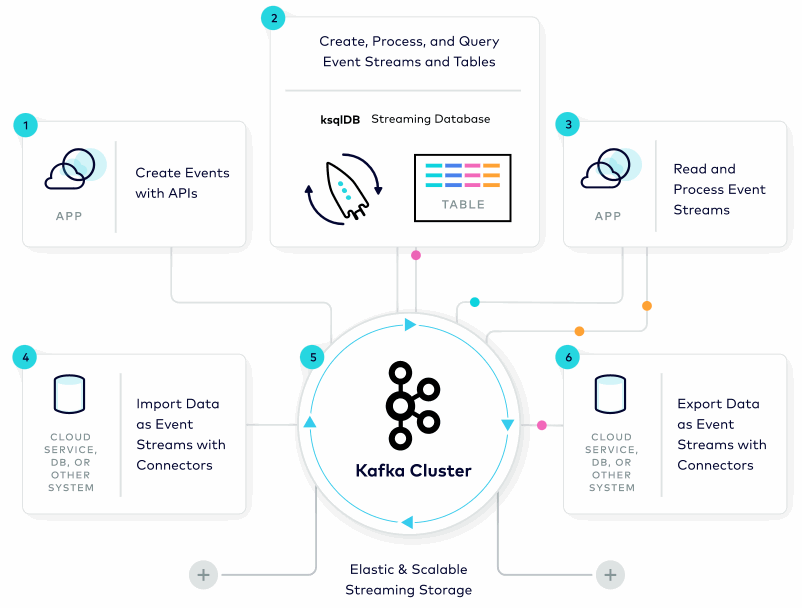

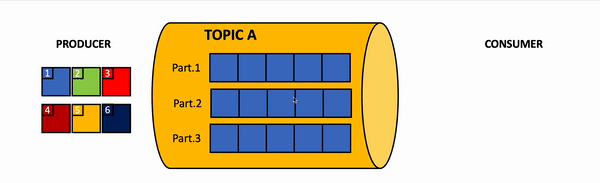

###  Docker 

**Docker: "Контейнеры для ваших приложений. Чтобы везде работало одинаково!"**

Знакома ситуация: "У меня на машине всё работает!" – а у коллеги или на сервере ваш гениальный Python-скрипт падает с непонятной ошибкой? Чаще всего это происходит из-за различий в окружении: разные версии библиотек, разные операционные системы, разные настройки...

**Docker** – это платформа для разработки, доставки и запуска приложений в **контейнерах**.

**Что такое контейнер? (Аналогия: Морской контейнер)**

Представьте себе стандартный морской контейнер. Неважно, что внутри – бананы, электроника или плюшевые мишки – его можно одинаково легко грузить на корабль, поезд или грузовик, потому что у него стандартные размеры и крепления.

Программный контейнер Docker – это похожая идея:
*   Он "упаковывает" ваше приложение (например, Python-скрипт, веб-сервис на Flask, ML-модель) вместе со всеми его **зависимостями** (библиотеки, системные утилиты, рантайм) в один изолированный "ящик".
*   Этот "ящик" можно запускать на любой машине, где установлен Docker, и приложение будет работать **одинаково**, независимо от того, какая там ОС или какие еще программы установлены.

**Ключевые концепции Docker:**

*   **Образ (Image):** Это шаблон, "чертеж" для создания контейнера. Образ содержит все необходимое: код приложения, библиотеки, переменные окружения, конфигурационные файлы. Образы строятся на основе **Dockerfile** – текстового файла с инструкциями. Образы неизменяемы. "Это как форма для выпечки кексов".
    *   Образы часто строятся слоями, наследуясь от базовых образов (например, образ `python:3.9-slim` уже содержит Python нужной версии).
*   **Контейнер (Container):** Это запущенный экземпляр образа. Вы можете запустить много контейнеров из одного и того же образа. Контейнеры изолированы друг от друга и от хост-системы. "Это сам кекс, испеченный по форме".
*   **Dockerfile:** Текстовый файл с инструкциями, по которым Docker собирает образ. Он описывает шаги: какой базовый образ взять, какие файлы скопировать внутрь, какие команды выполнить для установки зависимостей, какая команда будет запускаться при старте контейнера.
    ```dockerfile
    # Пример простого Dockerfile для Python-приложения
    # Используем официальный базовый образ Python
    FROM python:3.9-slim 
    
    # Устанавливаем рабочую директорию внутри контейнера
    WORKDIR /app
    
    # Копируем файл с зависимостями и устанавливаем их
    COPY requirements.txt .
    RUN pip install --no-cache-dir -r requirements.txt
    
    # Копируем остальные файлы приложения в рабочую директорию
    COPY . .
    
    # Команда, которая будет выполняться при запуске контейнера
    CMD ["python", "your_script.py"]
    ```
*   **Docker Hub (и другие реестры):** Публичное (или приватное) хранилище образов. Похоже на GitHub, но для Docker-образов. Вы можете скачивать готовые образы (например, для баз данных, веб-серверов) или загружать свои.

**Основные команды Docker (для понимания):**

*   `docker build -t my-app:latest .`: Собрать образ из Dockerfile в текущей директории (`.`) и присвоить ему имя `my-app` с тегом `latest`.
*   `docker run -d -p 8080:5000 my-app:latest`: Запустить контейнер из образа `my-app:latest`.
    *   `-d`: запустить в фоновом (detached) режиме.
    *   `-p 8080:5000`: пробросить порт 5000 внутри контейнера на порт 8080 хост-машины (если ваше приложение – веб-сервис, слушающий порт 5000).
*   `docker ps`: Показать список запущенных контейнеров.
*   `docker stop <container_id_or_name>`: Остановить контейнер.
*   `docker logs <container_id_or_name>`: Посмотреть логи контейнера.
*   `docker images`: Показать список образов, скачанных или собранных локально.
*   `docker pull ubuntu:latest`: Скачать образ `ubuntu:latest` из Docker Hub.
*   `docker push your-username/my-app:latest`: Загрузить ваш образ в Docker Hub (требуется `docker login`).

**Зачем Docker нужен Data Scientist'у / ML-инженеру?**

1.  **Воспроизводимость окружения:**
    *   Упакуйте ваш скрипт для обучения модели, скрипт для предобработки данных или API для предсказаний в Docker-контейнер. Теперь любой, у кого есть Docker, сможет запустить ваш код с теми же зависимостями, что и у вас. "Больше никаких 'а у меня другая версия Pandas'!"
2.  **Изоляция:**
    *   Разные проекты могут требовать разные, даже конфликтующие версии библиотек. Docker решает эту проблему.
3.  **Развертывание (Deployment) моделей:**
    *   Ваша обученная ML-модель, обернутая в API (например, с помощью Flask/FastAPI), может быть легко упакована в Docker-контейнер. Этот контейнер затем можно развернуть где угодно: на локальном сервере, в облаке (AWS, GCP, Azure), в Kubernetes. Это стандартный способ "доставки" моделей в продакшен.
4.  **Упрощение настройки сложных инструментов:**
    *   Многие инструменты (базы данных, тот же Spark или Kafka) можно быстро запустить локально в Docker-контейнере для тестирования или разработки, не мучаясь с их установкой и настройкой на вашей основной системе.

Docker – это невероятно полезный инструмент, который сильно упрощает жизнь разработчикам и тем, кто работает с данными. Понять его основы – очень важно.

###  Kubernetes 


**Kubernetes (K8s): "Дирижер для вашего оркестра из контейнеров"**

Окей, Docker – это круто. Мы можем упаковать наше приложение в контейнер. Но что, если у нас:
*   Много разных контейнеров, которые должны работать вместе (например, веб-приложение, база данных, очередь сообщений – все в своих контейнерах)?
*   Наше приложение должно быть отказоустойчивым (если один контейнер "умрет", его нужно автоматически перезапустить)?
*   Нам нужно масштабировать приложение (при увеличении нагрузки автоматически запускать больше экземпляров контейнера)?
*   Мы хотим обновлять приложение без простоя (rolling updates)?

Вручную управлять всем этим зоопарком контейнеров на нескольких серверах – задача не из легких. Вот тут и приходит на помощь **Kubernetes (часто сокращают до K8s – "k" + 8 букв + "s")**.

**Kubernetes** – это система с открытым исходным кодом для автоматизации развертывания, масштабирования и управления контейнеризированными приложениями. Изначально разработан Google, сейчас поддерживается Cloud Native Computing Foundation (CNCF).

**Что делает Kubernetes? (Проблемы, которые он решает)**

*   **Оркестрация контейнеров:** Управление жизненным циклом контейнеров (запуск, остановка, перезапуск).
*   **Распределение нагрузки (Load Balancing):** Равномерное распределение трафика между несколькими экземплярами вашего приложения.
*   **Масштабирование (Scaling):** Автоматическое (или ручное) увеличение или уменьшение количества работающих контейнеров в зависимости от нагрузки.
*   **Самовосстановление (Self-healing):** Автоматический перезапуск упавших контейнеров, замена "больных" узлов.
*   **Управление конфигурацией и секретами:** Безопасное хранение и предоставление конфигурационных данных и секретов (паролей, ключей API) контейнерам.
*   **Обнаружение сервисов (Service Discovery):** Как контейнерам находить друг друга в динамической среде кластера.
*   **Автоматизированные выкатки и откаты (Automated Rollouts and Rollbacks):** Постепенное обновление приложения до новой версии и возможность быстро откатиться, если что-то пошло не так.

**Основные концепции Kubernetes (очень-очень высокоуровнево):**

*   **Кластер (Cluster):** Состоит из нескольких машин (физических или виртуальных), называемых **Узлами (Nodes)**. Есть **Master Node(s)** (управляющие узлы, где работает "мозг" Kubernetes) и **Worker Node(s)** (рабочие узлы, где непосредственно запускаются ваши контейнеры).
*   **Pod (Под):** Минимальная развертываемая единица в Kubernetes. Pod – это один или несколько тесно связанных контейнеров (например, ваше приложение и вспомогательный контейнер для логирования), которые разделяют сетевое пространство и хранилище. "Это как домик для одного или нескольких очень дружных контейнеров". Обычно в Pod'е один основной контейнер.
*   **Deployment (Развертывание):** Декларативное описание желаемого состояния вашего приложения. Вы говорите: "Я хочу, чтобы всегда было запущено 3 экземпляра (реплики) моего приложения, использующего вот этот Docker-образ". Kubernetes сам позаботится о том, чтобы это состояние поддерживалось.
*   **Service (Сервис):** Определяет стабильный способ доступа к вашим Pod'ам (например, через единый IP-адрес и порт), даже если сами Pod'ы постоянно создаются и удаляются (из-за сбоев, обновлений, масштабирования). "Это как постоянный адрес для вашего приложения, даже если оно переезжает из домика в домик".
*   **Namespace (Пространство имен):** Способ разделить один физический кластер на несколько виртуальных кластеров. Удобно для изоляции проектов или команд.

**Kubernetes и Data Science / MLOps:**

*   **Развертывание ML-моделей как сервисов:** Docker-контейнер с вашей моделью (API) можно развернуть в Kubernetes, получив масштабируемый и отказоустойчивый сервис предсказаний.
*   **Оркестрация ML-пайплайнов:** Инструменты вроде Kubeflow используют Kubernetes для запуска и управления сложными пайплайнами машинного обучения (обработка данных, обучение, валидация, развертывание).
*   **Масштабируемое обучение моделей:** Kubernetes может использоваться для распределенного обучения моделей, выделяя необходимые ресурсы.

**Важно:** Kubernetes – это очень мощный, но и очень сложный инструмент. Обычно им занимаются DevOps-инженеры или ML-инженеры со специализацией в MLOps. Для Data Scientist'а важно понимать, **что это такое и какие возможности он дает**, особенно если вы работаете над выводом моделей в продакшен. Вам не обязательно уметь настраивать кластер с нуля, но понимать, как ваше Docker-приложение может быть развернуто с его помощью – полезно.


## 4. Введение в Нейронные Сети

### 1. Мотивация: Почему не всегда хватает классического ML?

Классические алгоритмы машинного обучения (линейная/логистическая регрессия, деревья решений, SVM, KNN и т.д.) прекрасны для многих задач, особенно когда:
*   Данные хорошо структурированы (привет, таблички!).
*   Зависимости между признаками и целевой переменной относительно простые или могут быть выражены явно.
*   Объем данных не запредельно огромен (хотя есть и масштабируемые версии).
*   Нам очень важна интерпретируемость модели ("почему модель приняла такое решение?").

**Но что, если...?**

*   **Сложные, нелинейные зависимости:** Представьте, что вам нужно отличить котика от собачки на фотографии. Какие признаки вы бы выделили вручную? Форма ушей? Длина хвоста? Цвет шерсти? Это очень сложно формализовать. Нейронные сети способны *сами* выучивать эти сложные иерархические признаки из сырых данных (пикселей изображения).
*   **Неструктурированные данные:** Изображения, видео, аудио, тексты на естественном языке. Классические алгоритмы обычно требуют серьезной предварительной обработки и "инженерии признаков" (feature engineering) для таких данных. Нейросети, особенно специализированные архитектуры (CNN для картинок, RNN для текстов), могут работать с ними более "напрямую".
*   **Огромные объемы данных:** Глубокие нейронные сети часто показывают лучшие результаты при наличии очень больших датасетов. Они "любят" много данных, чтобы настроить свои многочисленные параметры.
*   **Автоматическое извлечение признаков (Feature Learning):** Вместо того чтобы вручную придумывать признаки, глубокие сети учатся сами извлекать полезные представления данных на разных уровнях абстракции. Первый слой может научиться распознавать края и углы, следующий – простые формы, а еще более глубокие слои – уже целые объекты.

"Когда линейная регрессия уже не вывозит, а RandomForest задумчиво чешет макушку, на помощь приходят нейронные сети!"

**Но есть и обратная сторона (куда же без нее):**

*   **Требуют много данных:** Для обучения глубоких сетей часто нужны большие датасеты. На маленьких данных они могут переобучаться или не показать преимуществ перед классическим ML.
*   **Вычислительно дорогие:** Обучение глубоких сетей (особенно на больших данных) требует значительных вычислительных ресурсов, часто GPU (графических процессоров).
*   **"Черный ящик":** Интерпретировать, почему нейросеть приняла то или иное решение, бывает очень сложно. Это активная область исследований (Explainable AI, XAI).
*   **Подбор архитектуры и гиперпараметров:** Это целое искусство (и немного шаманство). Нужно выбрать количество слоев, нейронов, функции активации, оптимизатор и т.д.

**Когда НЕ стоит сразу бросаться на нейросети:**

*   Если у вас мало данных.
*   Если простая модель (например, логистическая регрессия) уже дает достаточно хорошее качество. "Не стреляйте из пушки по воробьям!"
*   Если интерпретируемость критически важна.
*   Если у вас нет доступа к GPU (хотя есть Google Colab!).

**Вывод:** Нейронные сети – это мощнейший инструмент, но не панацея. Используйте их там, где они действительно нужны и могут дать профит!

### 2. Биологическая интуиция 

Идея искусственных нейронных сетей была вдохновлена (очень упрощенно, конечно!) строением человеческого мозга.

*   **Биологический нейрон:** Клетка в мозге. У него есть **дендриты** (принимают сигналы от других нейронов), **тело клетки** (обрабатывает сигналы) и **аксон** (передает сигнал дальше, если суммарный входящий сигнал достаточно силен). Место контакта аксона одного нейрона с дендритом другого называется **синапс**. Сила связи (синапса) может меняться – это основа обучения.

*   **Искусственный нейрон (Перцептрон Розенблатта – дедушка всех нейронов):**
    *   **Входы (Inputs):** Принимают числовые значения (признаки объекта или выходы других нейронов).
    *   **Веса (Weights):** Каждому входу присваивается вес. Вес определяет "важность" этого входа. *Именно эти веса и будет подбирать нейросеть в процессе обучения!*
    *   **Сумматор:** Все входы умножаются на свои веса, и результаты суммируются (взвешенная сумма). Часто еще добавляется **смещение (bias)** – это как бы свободный член в уравнении, позволяющий нейрону "сдвигать" свою активацию.
    *   **Функция активации (Activation Function):** Результат взвешенной суммы пропускается через нелинейную функцию активации. Она решает, будет ли нейрон "возбуждаться" (активироваться) и какой сигнал он передаст дальше.

**Аналогия:** Представьте, что вы решаете, идти ли на пару к Воробьеву Д.
*   **Входы:** погода (хорошая/плохая), наличие планов на вечер (да/нет), скучно (да/нет).
*   **Веса:** насколько важен каждый из этих факторов *лично для вас*. Если вы ненавидете скуку, вес этого фактора будет высоким.
*   **Сумматор:** Вы мысленно "взвешиваете" все за и против.
*   **Функция активации:** Если суммарное "желание" превышает некий порог, вы "активируетесь" и идете на пару ко мне.

Конечно, это очень грубое упрощение, но оно дает общее представление. Нейросеть состоит из множества таких взаимосвязанных искусственных нейронов, организованных в слои.


### 3. Основные строительные блоки нейронной сети

Давайте разберем "Lego-кубики", из которых строятся нейронные сети.

#### А. Нейрон (Юнит)

Мы уже коснулись его. Формально, выход одного нейрона `y` можно описать так:

`z = (w_1 * x_1) + (w_2 * x_2) + ... + (w_n * x_n) + b`
`y = f(z)`

Где:
*   `x_1, ..., x_n` – входы.
*   `w_1, ..., w_n` – веса.
*   `b` – смещение (bias).
*   `z` – взвешенная сумма (иногда называют "логит", если дальше будет сигмоида/софтмакс).
*   `f()` – функция активации.

#### Б. Слои (Layers)

Нейроны обычно организуются в слои:

*   **Входной слой (Input Layer):** "Приемная" нейросети. Количество нейронов в нем равно количеству признаков вашего объекта. Эти нейроны ничего не вычисляют, они просто передают входные значения дальше.
*   **Скрытые слои (Hidden Layers):** "Мозговой центр". Здесь происходит основная магия вычислений и извлечения признаков. Может быть один или много скрытых слоев (если много – это "глубокая" сеть). Количество нейронов и слоев – это гиперпараметры, которые мы подбираем.
    *   **Полносвязный слой (Dense Layer / Fully Connected Layer):** Самый распространенный тип слоя. Каждый нейрон этого слоя связан с *каждым* нейроном предыдущего слоя.
*   **Выходной слой (Output Layer):** "Отдел выдачи результатов". Количество нейронов и их функции активации зависят от задачи:
    *   **Регрессия:** Обычно один нейрон с линейной функцией активации (или без нее), который выдает предсказанное числовое значение.
    *   **Бинарная классификация:** Один нейрон с сигмоидной функцией активации (выдает вероятность принадлежности к классу 1).
    *   **Многоклассовая классификация:** `N` нейронов (где `N` – число классов) с функцией активации Softmax (выдает распределение вероятностей по всем классам).

#### В. Функции активации (Activation Functions)

Они добавляют нелинейность в модель. Без нелинейных функций активации вся нейросеть, какой бы глубокой она ни была, была бы эквивалентна простой линейной модели! А мир (и данные в нем) редко бывает линейным.

Популярные функции активации (показать графики!):

1.  **Sigmoid (Логистическая функция):**
    *   Формула: `f(z) = 1 / (1 + exp(-z))`
    *   Выход: от 0 до 1.
    *   Использование: Раньше часто использовалась в скрытых слоях, но сейчас реже из-за проблемы "затухания градиентов". В основном используется в выходном слое для бинарной классификации (для получения вероятности).
    *   "Плавно сжимает любое число в интервал (0, 1)".

2.  **Tanh (Гиперболический тангенс):**
    *   Формула: `f(z) = (exp(z) - exp(-z)) / (exp(z) + exp(-z))`
    *   Выход: от -1 до 1.
    *   Похожа на сигмоиду, но центрирована вокруг нуля, что иногда лучше для оптимизации. Тоже страдает от затухания градиентов.
    *   "Как сигмоида, но от -1 до 1".

3.  **ReLU (Rectified Linear Unit – Выпрямленный линейный блок):**
    *   Формула: `f(z) = max(0, z)`
    *   Выход: от 0 до +∞.
    *   **Самая популярная функция активации для скрытых слоев!**
    *   Преимущества: вычислительно очень простая, помогает бороться с затуханием градиентов (для положительных значений).
    *   Недостаток: "умирающие ReLU" (если нейрон всегда получает на вход отрицательные значения, его выход и градиент будут равны нулю, и он перестает учиться).
    *   "Все, что меньше нуля – обнуляем. Все, что больше – оставляем как есть. Просто и эффективно!"

4.  **Leaky ReLU (и его вариации: PReLU, ELU):**
    *   Модификации ReLU, чтобы решить проблему "умирающих нейронов". Для отрицательных `z` дают небольшой ненулевой градиент (например, `f(z) = 0.01*z` если `z < 0`).

5.  **Softmax:**
    *   Используется в **выходном слое для многоклассовой классификации**.
    *   Преобразует вектор вещественных чисел (логитов) в распределение вероятностей (все выходы от 0 до 1, и их сумма равна 1).
    *   "Делит пирог уверенности между всеми классами".

#### Г. Функция потерь (Loss Function / Cost Function)

Как мы измеряем, насколько "плохо" работает наша нейросеть? Нам нужна метрика, которая показывает ошибку модели на обучающих данных. Эту ошибку мы и будем пытаться минимизировать.

*   **Для регрессии:**
    *   **MSE (Mean Squared Error – Среднеквадратичная ошибка):** `L = (1/N) * Σ(y_true - y_pred)^2`. Очень популярна. Штрафует за большие ошибки сильнее.
    *   **MAE (Mean Absolute Error – Средняя абсолютная ошибка):** `L = (1/N) * Σ|y_true - y_pred|`. Менее чувствительна к выбросам.

*   **Для классификации:**
    *   **Binary Cross-Entropy (Бинарная перекрестная энтропия):** Для бинарной классификации (с сигмоидой на выходе).
        `L = - (y_true * log(y_pred) + (1 - y_true) * log(1 - y_pred))`
    *   **Categorical Cross-Entropy (Категориальная перекрестная энтропия):** Для многоклассовой классификации (с Softmax на выходе), когда метки классов представлены в виде one-hot encoding (например, `[0, 0, 1]`).
    *   **Sparse Categorical Cross-Entropy:** То же, что и категориальная, но когда метки классов – это просто целые числа (например, `0, 1, 2`).

Функция потерь вычисляется для каждого примера в обучающей выборке (или для батча), а затем усредняется.

#### Д. Оптимизация: Как нейросеть учится?

"Окей, у нас есть архитектура, есть функция потерь. Как же подобрать те самые волшебные веса `w` и смещения `b`, чтобы ошибка была минимальной?"

Ответ: с помощью **алгоритмов оптимизации**. Самый известный – **Градиентный спуск (Gradient Descent)**.

**Интуиция градиентного спуска:**
Представьте, что вы стоите на склоне горы в тумане (поверхность потерь) и хотите спуститься вниз (к минимуму потерь). Что вы делаете? Ощупываете землю вокруг себя, находите направление самого крутого спуска (это и есть **антиградиент**) и делаете небольшой шаг в этом направлении. Повторяете, пока не достигнете долины.

*   **Градиент:** Вектор, показывающий направление наискорейшего роста функции потерь. Мы движемся в противоположном направлении (антиградиент).
*   **Скорость обучения (Learning Rate, α):** Размер шага, который мы делаем.
    *   Слишком маленький learning rate: обучение будет очень медленным.
    *   Слишком большой learning rate: можем "перепрыгнуть" минимум и не сойтись.
    Это важный гиперпараметр!

**Процесс обучения (одна эпоха):**
1.  **Прямое распространение (Forward Propagation):**
    *   Берем батч (небольшую порцию) данных из обучающей выборки.
    *   Прогоняем его через сеть от входа к выходу, вычисляя активации всех нейронов.
    *   Получаем предсказания `y_pred`.
    *   Вычисляем функцию потерь `L(y_true, y_pred)`.

2.  **Обратное распространение ошибки (Backpropagation):**
    *   "Магия" начинается здесь! Это алгоритм, который позволяет эффективно вычислить градиенты функции потерь по всем весам и смещениям в сети.
    *   Он работает "задом наперед": от выходного слоя к входному, вычисляя, какой "вклад" внес каждый вес в общую ошибку. Используется правило цепочки (chain rule) из матанализа.
    *   "Разбираемся, кто виноват в ошибке и насколько сильно".

3.  **Обновление весов:**
    *   Используя вычисленные градиенты и скорость обучения, обновляем все веса и смещения:
      `w_new = w_old - α * (dL/dw)`
      `b_new = b_old - α * (dL/db)`

Этот цикл (forward pass -> backpropagation -> weight update) повторяется для всех батчей в обучающей выборке. Проход по всей обучающей выборке один раз называется **эпохой (epoch)**. Обучение обычно длится много эпох.

**Оптимизаторы (помимо простого Gradient Descent):**

Простой градиентный спуск имеет свои проблемы (медленная сходимость, застревание в локальных минимумах). Поэтому были разработаны более продвинутые оптимизаторы:

*   **SGD (Stochastic Gradient Descent):** Градиент считается не по всей выборке, а по одному примеру или небольшому батчу. Шумнее, но часто быстрее сходится и лучше избегает локальных минимумов.
*   **Momentum:** Добавляет "инерцию" к обновлению весов, помогая быстрее двигаться в нужном направлении и проскакивать мелкие локальные минимумы.
*   **AdaGrad, RMSProp, Adam (Adaptive Moment Estimation):** Адаптивные оптимизаторы. Они подстраивают скорость обучения для каждого параметра индивидуально. **Adam** – очень популярный и часто хороший выбор по умолчанию. "Эти ребята умнее, они сами регулируют скорость шага для разных направлений".

### 4. Основные типы нейросетей 

Мы говорили в основном о **Многослойном Перцептроне (Multilayer Perceptron, MLP)** – это и есть полносвязные слои, которые мы обсуждали. Он хорош для табличных данных. Но для других типов данных есть более специализированные архитектуры:

1.  **Сверточные Нейронные Сети (Convolutional Neural Networks, CNN / ConvNets):**
    *   **Короли компьютерного зрения!** Отлично работают с изображениями, видео.
    *   **Ключевые идеи:**
        *   **Сверточные слои (Convolutional Layers):** Вместо того чтобы каждый нейрон смотрел на все пиксели предыдущего слоя, здесь используются небольшие **фильтры (ядра свертки)**, которые "скользят" по изображению и выделяют локальные признаки (края, текстуры, узоры). Один фильтр ищет один тип признака по всему изображению (разделение параметров – weight sharing). "Это как детекторы, ищущие определенные паттерны".
        *   **Пулинг слои (Pooling Layers, например, MaxPooling):** Уменьшают пространственный размер карты признаков (картинки), сохраняя самую важную информацию. Помогают сделать модель более устойчивой к небольшим сдвигам объекта на изображении и уменьшают количество параметров. "Сжимаем картинку, оставляя только самое главное".
    *   Типичная архитектура CNN: [CONV -> ReLU -> POOL] x N -> Flatten -> Dense -> Softmax.
    *   Примеры: классификация изображений (AlexNet, VGG, ResNet, EfficientNet), детекция объектов, сегментация.

2.  **Рекуррентные Нейронные Сети (Recurrent Neural Networks, RNN):**
    *   **Специалисты по последовательностям!** Предназначены для данных, где важен порядок элементов: тексты, временные ряды, аудио, видео (кадры).
    *   **Ключевая идея:** У RNN есть "память". Выход сети на текущем шаге зависит не только от текущего входа, но и от выходов (или скрытых состояний) на предыдущих шагах. Нейроны как бы передают информацию самим себе из прошлого. "Сеть, которая помнит, что было сказано раньше".
    *   **Проблема простого RNN:** Затухание или взрыв градиента при обработке длинных последовательностей (трудно запомнить информацию надолго).
    *   **Решение: LSTM (Long Short-Term Memory) и GRU (Gated Recurrent Unit):** Более сложные рекуррентные ячейки со специальными "вентилями" (gates), которые управляют потоком информации и решают, что запоминать, что забывать, а что передавать дальше. Они гораздо лучше справляются с длинными зависимостями. "LSTM и GRU – это RNN с прокачанной памятью".
    *   Примеры: машинный перевод, генерация текста, анализ тональности, распознавание речи, прогнозирование временных рядов.

3.  **Трансформеры (Transformers):**
    *   **Новая звезда, особенно в обработке естественного языка (NLP)!** (BERT, GPT, T5 и др.)
    *   **Ключевая идея: Механизм внимания (Attention Mechanism).** Позволяет модели при обработке одного элемента последовательности (например, слова в предложении) обращать "внимание" на другие важные элементы этой же последовательности, независимо от их удаленности. "Модель сама решает, какие слова в предложении наиболее важны для понимания текущего слова".
    *   В отличие от RNN, трансформеры могут обрабатывать все элементы последовательности параллельно, что делает их быстрее на GPU.
    *   Сейчас активно применяются не только в NLP, но и в компьютерном зрении (Vision Transformers) и других областях.

Это, конечно, не все типы, есть еще Generative Adversarial Networks (GANs – для генерации реалистичных данных), Autoencoders (для уменьшения размерности и поиска аномалий) и много других интересных архитектур. Но CNN, RNN и Трансформеры – это три кита современного Deep Learning, о которых стоит знать.


### 5. Практический пример: Простая нейросеть на Keras/TensorFlow

Хватит теории, давайте что-нибудь напишем! Мы будем использовать **Keras** – это высокоуровневый API для построения и обучения нейронных сетей, который работает поверх **TensorFlow** (или других бэкендов, таких как JAX или PyTorch, но TensorFlow самый частый для Keras). Keras очень дружелюбен к новичкам.

**Задача:** Классификация изображений рукописных цифр из датасета MNIST. Это "Hello, World!" в мире Deep Learning.
Датасет MNIST содержит 60,000 обучающих и 10,000 тестовых изображений цифр от 0 до 9, размером 28x28 пикселей (черно-белые).


Для выполнения кода в этой практической части вам понадобится библиотека **TensorFlow**. Если она у вас еще не установлена, вы можете установить ее с помощью pip. Рекомендуется делать это в виртуальном окружении.


In [82]:
!pip install tensorflow



     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 644.8/644.8 MB 1.2 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.6/135.6 kB 10.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.5/57.5 kB 9.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.5/24.5 MB 35.2 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 71.9/71.9 kB 931.3 kB/s eta 0:00:0000:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.9/5.9 MB 45.7 MB/s eta 0:00:0000:01:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 38.5 MB/s eta 0:00:0000:01:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 29.4 MB/s eta 0:00:00:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 44.1 MB/s eta 0:00:0000:01:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 53.8 MB/s eta 0:00:0000:01:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.1/5.1 MB 42.3 MB/s eta 0:00:0000:01:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [83]:
# Импортируем необходимые библиотеки
import tensorflow as tf
from tensorflow import keras # Keras API
from tensorflow.keras.layers import Dense, Flatten # Типы слоев, которые нам понадобятся
from tensorflow.keras.datasets import mnist # Датасет MNIST
from tensorflow.keras.utils import to_categorical # Для one-hot encoding меток

2025-05-06 13:15:30.479991: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-05-06 13:15:30.482294: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-05-06 13:15:30.486853: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-05-06 13:15:30.499629: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1746537330.520485 3762950 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1746537330.52

In [84]:
import numpy as np
import matplotlib.pyplot as plt

In [85]:
# Загрузка данных MNIST (они уже встроены в Keras)
(x_train, y_train), (x_test, y_test) = mnist.load_data()

11490434/11490434 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


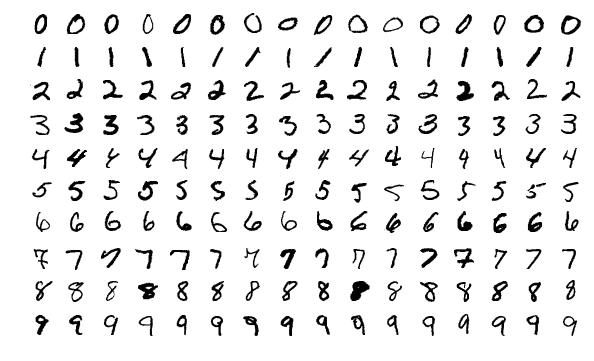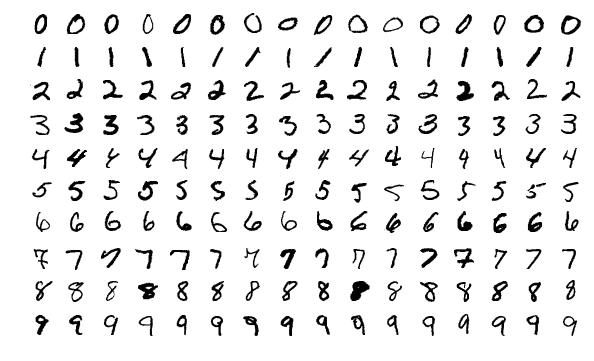

In [86]:
# Посмотрим на размеры данных
print("Размер обучающей выборки (изображения):", x_train.shape) # (60000, 28, 28)
print("Размер обучающей выборки (метки):", y_train.shape)     # (60000,)
print("Размер тестовой выборки (изображения):", x_test.shape)   # (10000, 28, 28)
print("Размер тестовой выборки (метки):", y_test.shape)       # (10000,)

Размер обучающей выборки (изображения): (60000, 28, 28)
Размер обучающей выборки (метки): (60000,)
Размер тестовой выборки (изображения): (10000, 28, 28)
Размер тестовой выборки (метки): (10000,)


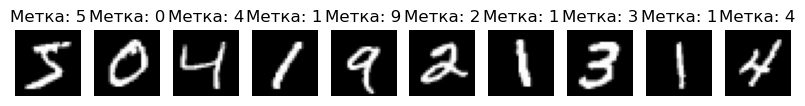

In [87]:
# Давайте посмотрим на несколько примеров изображений
plt.figure(figsize=(10,1))
for i in range(10):
    plt.subplot(1, 10, i+1)
    plt.imshow(x_train[i], cmap='gray')
    plt.title(f"Метка: {y_train[i]}")
    plt.axis('off')
plt.show()

**1. Предобработка данных**

In [88]:
# 1.1 Нормализация изображений
# Пиксели изображений имеют значения от 0 до 255. 
# Для нейросетей лучше нормализовать данные (например, в диапазон [0, 1] или [-1, 1]).
x_train = x_train.astype('float32') / 255.0
x_test = x_test.astype('float32') / 255.0

In [89]:
# 1.2 Преобразование меток в формат one-hot encoding
# Сейчас метки y_train и y_test - это просто числа от 0 до 9.
# Для многоклассовой классификации с Softmax на выходе нам нужны метки в формате one-hot.
# Например, метка '5' станет вектором [0,0,0,0,0,1,0,0,0,0]
num_classes = 10 # 10 цифр (0-9)
y_train_categorical = to_categorical(y_train, num_classes)
y_test_categorical = to_categorical(y_test, num_classes)

print("\nПример метки до one-hot:", y_train[0])
print("Пример метки после one-hot:", y_train_categorical[0])


Пример метки до one-hot: 5
Пример метки после one-hot: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]


In [90]:
# 1.3 Изменение формы входных данных (для полносвязных слоев)
# Наша простая модель будет использовать полносвязные (Dense) слои.
# Они ожидают на вход одномерный вектор признаков.
# Сейчас наши изображения 28x28. Их нужно "распрямить" в вектор 28*28 = 784.
# Мы можем сделать это с помощью слоя Flatten прямо в модели,
# или подготовить данные заранее. Давайте используем слой Flatten.
# Если бы мы готовили данные:
# x_train_flattened = x_train.reshape(x_train.shape[0], 28 * 28)
# x_test_flattened = x_test.reshape(x_test.shape[0], 28 * 28)
# print("Размер 'распрямленных' данных:", x_train_flattened.shape) 

**2. Определение архитектуры модели**

Мы будем использовать `keras.Sequential` API – это самый простой способ построить модель, представляющую собой линейный стек слоев.

In [92]:
model = keras.Sequential([
    # Слой Flatten преобразует матрицу 28x28 в вектор 784
    Flatten(input_shape=(28, 28)),  # Указываем форму входа (без размера батча)
    
    # Первый полносвязный (Dense) скрытый слой
    # 128 нейронов (это гиперпараметр, можно подбирать)
    # Функция активации ReLU - хороший стандарт для скрытых слоев
    Dense(128, activation='relu'), 
    
    # Можно добавить еще один скрытый слой для "глубины"
    # Dense(64, activation='relu'), 
    
    # Выходной полносвязный слой
    # num_classes (10) нейронов - по одному на каждый класс (цифру)
    # Функция активации Softmax - для многоклассовой классификации (выдаст вероятности)
    Dense(num_classes, activation='softmax') 
])

# Посмотрим на структуру модели
model.summary()

/opt/conda/lib/python3.10/site-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
2025-05-06 13:21:28.769720: E external/local_xla/xla/stream_executor/cuda/cuda_platform.cc:51] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ flatten (Flatten)               │ (None, 784)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │       100,480 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 10)             │         1,290 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 101,770 (397.54 KB)

 Trainable params: 101,770 (397.54 KB)

 Non-trainable params: 0 (0.00 B)

**3. Компиляция модели**

Перед обучением модель нужно "скомпилировать". Здесь мы указываем:
*   **Оптимизатор (optimizer):** Алгоритм, который будет обновлять веса (например, 'adam', 'sgd', 'rmsprop').
*   **Функцию потерь (loss function):** Что мы будем минимизировать. Для многоклассовой классификации с one-hot метками – 'categorical_crossentropy'. (Если бы метки были целыми числами, использовали бы 'sparse_categorical_crossentropy').
*   **Метрики (metrics):** По каким метрикам мы будем оценивать качество модели во время обучения и тестирования (например, 'accuracy' – точность).

In [94]:
model.compile(optimizer='adam', # Adam - хороший выбор по умолчанию
              loss='categorical_crossentropy', 
              metrics=['accuracy'])

**4. Обучение модели (Training / Fitting)**

Теперь самое интересное – обучение! Мы "скармливаем" модели обучающие данные (`x_train`, `y_train_categorical`).

*   `epochs`: Количество раз, которое модель "просмотрит" всю обучающую выборку.
*   `batch_size`: Размер порции данных, которая подается на вход модели за одну итерацию обновления весов.
*   `validation_data`: Данные, на которых модель будет проверяться после каждой эпохи (чтобы отслеживать переобучение). Мы будем использовать тестовый набор, хотя в идеале нужна отдельная валидационная выборка.

In [122]:
# Задаем параметры обучения
epochs = 10  # Начнем с 10 эпох
batch_size = 32 

print("\nНачинаем обучение модели...")
# Обучаем модель и сохраняем историю обучения (для графиков)
history = model.fit(x_train, 
                    y_train_categorical, 
                    epochs=epochs, 
                    batch_size=batch_size,
                    validation_data=(x_test, y_test_categorical), # Оценка на тестовых данных после каждой эпохи
                    verbose=1) # verbose=1 будет показывать прогресс-бар

print("Обучение завершено!")


Начинаем обучение модели...
Epoch 1/10
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.9971 - loss: 0.0102 - val_accuracy: 0.9773 - val_loss: 0.0883
Epoch 2/10
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.9975 - loss: 0.0103 - val_accuracy: 0.9776 - val_loss: 0.0829
Epoch 3/10
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.9970 - loss: 0.0092 - val_accuracy: 0.9780 - val_loss: 0.0918
Epoch 4/10
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.9980 - loss: 0.0068 - val_accuracy: 0.9791 - val_loss: 0.0888
Epoch 5/10
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - accuracy: 0.9982 - loss: 0.0067 - val_accuracy: 0.9793 - val_loss: 0.0901
Epoch 6/10
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.9982 - loss: 0.0057 - val_accuracy: 0.9785 - val_loss: 0.0963
Epoch 7/10
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.9985 - loss: 0.0056 - val_accuracy: 0.9776 - val_loss: 0.1029
Epoch 8/10
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accur

In [123]:
loss, accuracy = model.evaluate(x_test, y_test_categorical, verbose=0)
print(f"\nКачество на тестовых данных:")
print(f"  Потери (Loss): {loss:.4f}")
print(f"  Точность (Accuracy): {accuracy:.4f} (или {accuracy*100:.2f}%)")

# Это довольно хорошая точность для такой простой модели!


Качество на тестовых данных:
  Потери (Loss): 0.1212
  Точность (Accuracy): 0.9776 (или 97.76%)


**6. Визуализация истории обучения**

Полезно посмотреть, как менялись потери и точность во время обучения на обучающей и валидационной (тестовой) выборках. Это помогает понять, не переобучилась ли модель.

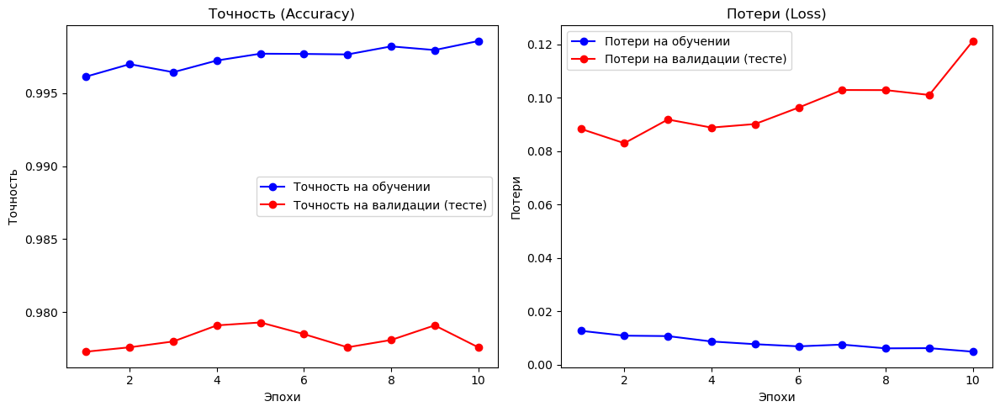

In [124]:
history_dict = history.history
# print(history_dict.keys()) # dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

acc = history_dict['accuracy']
val_acc = history_dict['val_accuracy']
loss = history_dict['loss']
val_loss = history_dict['val_loss']

epochs_range = range(1, epochs + 1)

plt.figure(figsize=(12, 5))

# График точности
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, 'bo-', label='Точность на обучении')
plt.plot(epochs_range, val_acc, 'ro-', label='Точность на валидации (тесте)')
plt.title('Точность (Accuracy)')
plt.xlabel('Эпохи')
plt.ylabel('Точность')
plt.legend()

# График потерь
plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, 'bo-', label='Потери на обучении')
plt.plot(epochs_range, val_loss, 'ro-', label='Потери на валидации (тесте)')
plt.title('Потери (Loss)')
plt.xlabel('Эпохи')
plt.ylabel('Потери')
plt.legend()

plt.tight_layout()
plt.show()

# Если кривая точности на обучении продолжает расти, а на валидации стагнирует или падает,
# это признак переобучения (overfitting).
# В нашем случае на 10 эпохах переобучение еще не сильно заметно, но если учить дольше, оно может проявиться.
# Методы борьбы с переобучением: dropout, L1/L2 регуляризация, data augmentation, early stopping.

**7. Предсказания на новых данных**

Давайте возьмем несколько изображений из тестового набора и посмотрим, что предскажет наша модель.

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


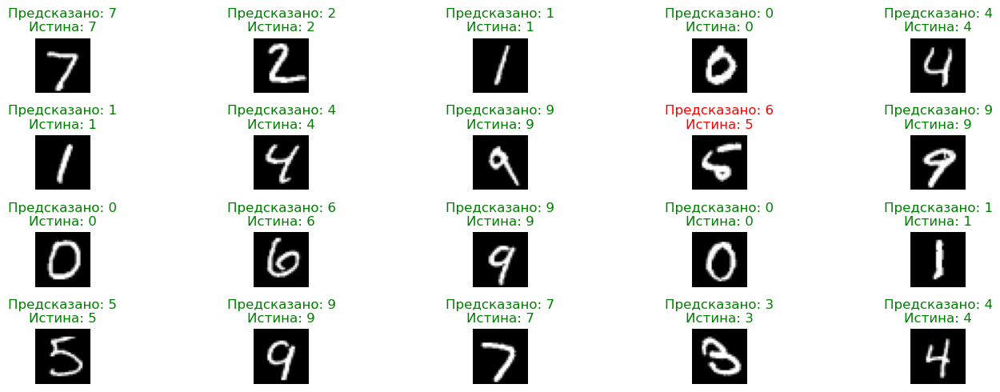

In [125]:
# Делаем предсказания для первых N изображений из тестового набора
num_predictions = 20
predictions_softmax = model.predict(x_test[:num_predictions]) 
# print("Предсказания (Softmax выходы):\n", predictions_softmax[0]) # Вероятности для каждого класса

# Преобразуем вероятности в предсказанные классы (номер цифры)
# np.argmax находит индекс максимального элемента (т.е. класс с наибольшей вероятностью)
predicted_classes = np.argmax(predictions_softmax, axis=1)
# print("\nПредсказанные классы:\n", predicted_classes)

# Истинные метки для этих изображений
true_classes = y_test[:num_predictions] # Исходные метки, не one-hot

# Визуализируем результаты
plt.figure(figsize=(15, 5))
for i in range(num_predictions):
    plt.subplot(4, 5, i + 1) # 2 ряда по 5 картинок
    plt.imshow(x_test[i], cmap='gray')
    plt.title(f"Предсказано: {predicted_classes[i]}\nИстина: {true_classes[i]}", 
              color=("green" if predicted_classes[i] == true_classes[i] else "red"))
    plt.axis('off')
plt.tight_layout()
plt.show()

# Рекомендации

*   **APIs и Скрапинг:**
    *   Практикуйтесь с разными API (погода, финансы, соцсети – многие требуют регистрации и API-ключ).
    *   Попробуйте Selenium или Playwright для скрапинга динамических сайтов 

*   **GIT:**
    *   Используйте GIT для *всех* своих проектов, даже личных. Привыкайте к командам `add`, `commit`, `push`, `pull`, `branch`, `merge`.
    *   Разберитесь с разрешением конфликтов слияния.
    *   Поработайте над проектом в команде, используя GitHub Flow или Gitflow (упрощенно).
*   **Большие Данные (Spark, Kafka):**
    *   Если есть возможность, попробуйте поработать с PySpark локально (можно установить Spark на свой компьютер или использовать Docker-образ).
    *   Изучите DataFrame API в PySpark – он очень похож на Pandas.
    *   Почитайте больше про архитектуру Kafka и сценарии ее использования.
*   **Docker и Kubernetes:**
    *   Установите Docker Desktop. Попробуйте "докеризировать" простое Python-приложение (например, Flask API).
    *   Запустите готовые образы из Docker Hub (например, базу данных PostgreSQL или веб-сервер Nginx).
    *   Для Kubernetes: Minikube или Kind позволяют запустить маленький K8s-кластер локально для экспериментов. Попробуйте развернуть свой Docker-образ в нем.
    *   Изучите `kubectl` – основной инструмент командной строки для K8s.
*   **Нейронные Сети:**
    *   **Глубоко погрузитесь в один фреймворк:** TensorFlow/Keras или PyTorch. Пройдите их официальные туториалы.
    *   Изучите разные архитектуры (CNN, RNN/LSTM) и попробуйте их на соответствующих задачах (классификация изображений CIFAR-10, анализ тональности текстов IMDB).
    *   Участвуйте в соревнованиях на Kaggle – там часто используются нейросети.
    *   Курсы: DeepLearning.AI (Andrew Ng на Coursera), Fast.ai, курсы от Stanford (CS231n для CV, CS224n для NLP).
*   **MLOps и Пайплайны:**
    *   Посмотрите на Airflow, Kubeflow, DVC. Попробуйте построить простой пайплайн.
*   **Облачные платформы:**
    *   Создайте аккаунт в AWS, GCP или Azure (у многих есть бесплатный уровень – Free Tier). Попробуйте их сервисы для хранения, вычислений, ML.
